In [13]:
import pinocchio as pin
import numpy as np
from robot import *

# モデル・データ読み込み
model = get_simple_arm(dof=3)  # 自分のURDFを読み込むなら buildModelFromUrdf
data = model.createData()

# 初期姿勢
q = pin.neutral(model)

# エンドエフェクタのframe名とid
frame_name = "dummy_link"
frame_id = model.getFrameId(frame_name)

# 目標位置と姿勢（SE3）
theta = np.pi/4
Rs = pin.utils.rotate("y", -3*theta)
start_placement = pin.SE3(Rs, np.array([-2, 0, 0]))
Re = pin.utils.rotate("y", 3*theta)
end_placement = pin.SE3(Re, np.array([2, 0, 0]))

start = ik_se3_solver(model, data, frame_id, start_placement)
end = ik_se3_solver(model, data, frame_id, end_placement)



URDFファイルを ./robots/simple_arm_dof3.urdf に保存しました。自由度: 3
収束しました！ iteration: 22
収束しました！ iteration: 22


2025-06-16 17:10:03,553 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.9}


URDFファイルを ./robots/simple_arm_dof3.urdf に保存しました。自由度: 3
収束しました！ iteration: 22
収束しました！ iteration: 22


pyswarms.single.global_best:   0%|          |0/100

pyswarms.single.global_best: 100%|██████████|100/100, best_cost=1.5e+4
2025-06-16 17:10:13,201 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 15020.86450996072, best pos: [-0.52015777 -0.319553    0.08636842 -0.05059786  0.3833174   0.69277189
  0.36218069  0.80321729  1.11282173]
2025-06-16 17:10:13,217 - matplotlib.animation - INFO - Animation.save using <class 'matplotlib.animation.PillowWriter'>


saving as 'jerkopt.gif'...


2025-06-16 17:10:18,906 - matplotlib.animation - INFO - Animation.save using <class 'matplotlib.animation.PillowWriter'>


saved as jerkopt.gif
saving as 'jerkopt2D.gif'...
saved as jerkopt2D.gif
全フレーム数: 50
取り出すフレーム番号: [0, 12, 24, 37, 49]
完了しました。
全フレーム数: 50
取り出すフレーム番号: [0, 12, 24, 37, 49]
完了しました。


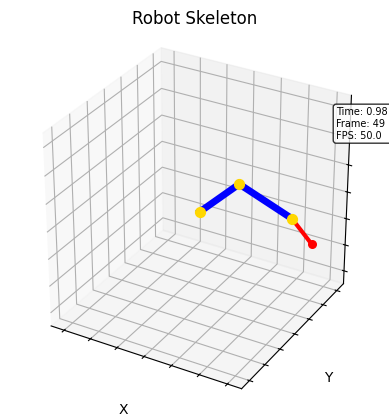

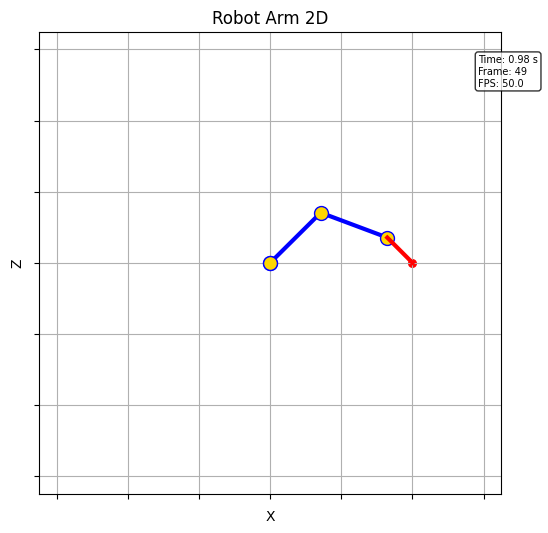

In [14]:
#ジャーク最小化

# モデル・データ読み込み
model = get_simple_arm(dof=3)  # 自分のURDFを読み込むなら buildModelFromUrdf
data = model.createData()

# 初期姿勢
q = pin.neutral(model)

# エンドエフェクタのframe名とid
frame_name = "dummy_link"
frame_id = model.getFrameId(frame_name)

# 目標位置と姿勢（SE3）
theta = np.pi/4
Rs = pin.utils.rotate("y", -3*theta)
start_placement = pin.SE3(Rs, np.array([-2, 0, 0]))
Re = pin.utils.rotate("y", 3*theta)
end_placement = pin.SE3(Re, np.array([2, 0, 0]))

start = ik_se3_solver(model, data, frame_id, start_placement)
end = ik_se3_solver(model, data, frame_id, end_placement)

time_steps = 50
dt = 0.02
qz = pin.neutral(model)

limits = same_limits(model.nq)
num_knots = 5
best_cost, best_particle = optimize_jerk(model,data,start,end,limits,time_steps,dt,n_particles=100)
qs = qs_from_particle(best_particle,
                      model=model,
                      time_steps=time_steps,
                      start=start,
                      end=end,
                      limits=limits,
                      num_knots=num_knots)
# print("最適コスト:", best_cost)
# print("最適軌道形状:", qs)
plot_robot_motion(model,qs,dt,movie="jerkopt")
plot_robot_motion(model, qs, dt, movie="jerkopt2D", is_3d=False)
get_keyframes("jerkopt.gif", 5)
get_keyframes("jerkopt2D.gif", 5)

2025-06-16 17:10:23,504 - matplotlib.animation - INFO - Animation.save using <class 'matplotlib.animation.PillowWriter'>


saving as 'jerkopt2D.gif'...
saved as jerkopt2D.gif
全フレーム数: 50
取り出すフレーム番号: [0, 12, 24, 37, 49]
完了しました。


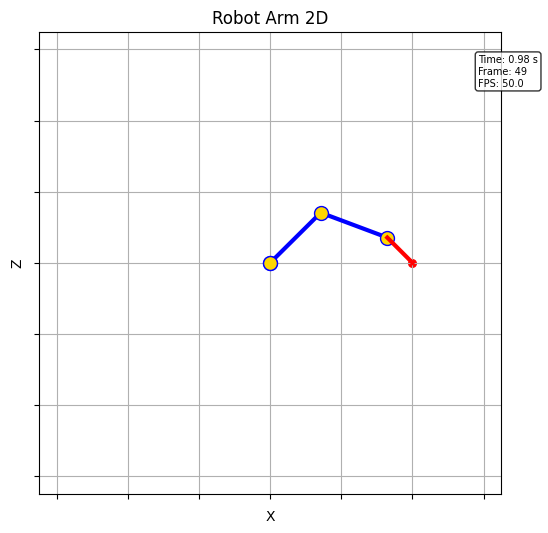

In [15]:
from PIL import Image
import os

def get_keyframes(filepath, num_samples, output_dir=None):
    """
    
    """
    # GIFファイルのパス
    gif_path = filepath
    gif_dir = os.path.dirname(gif_path)
    gif_name = os.path.splitext(os.path.basename(gif_path))[0]

     # 出力先フォルダのパスを作成
    output_dir = os.path.join(gif_dir, f"{gif_name}_keyframes")
    os.makedirs(output_dir, exist_ok=True)

    # GIFを開く
    img = Image.open(gif_path)

    # 全フレーム数の取得
    total_frames = img.n_frames
    print(f'全フレーム数: {total_frames}')

    # 等間隔のフレーム番号を計算（はじめと終わり含む）
    frame_indices = [round(i * (total_frames - 1) / (num_samples - 1)) for i in range(num_samples)]
    print(f'取り出すフレーム番号: {frame_indices}')

    # 指定したフレームを保存
    for i, frame_index in enumerate(frame_indices):
        img.seek(frame_index)  # 指定フレームへ
        frame = img.convert("RGB")  # RGB変換（必要なら）
        frame.save(os.path.join(output_dir, f'frame_{i}.png'))
    print('完了しました。')

from robot import *
plot_robot_motion(model, qs, dt, movie="jerkopt2D", is_3d=False)
get_keyframes("jerkopt2D.gif", 5)


energy(0): 6140.102185846693
energy(1): 27658.82727460177
energy(2): 10962.330377507626
energy(3): 7095.272838613025
energy(4): 5570.85655043207
energy(5): 13828.319671810685
energy(6): 6135.435418834669
energy(7): 11819.015162234627


2025-06-16 17:10:27,977 - matplotlib.animation - INFO - Animation.save using <class 'matplotlib.animation.HTMLWriter'>


energy(8): 7439.126978519527
energy(9): 13211.673181323713
not saved


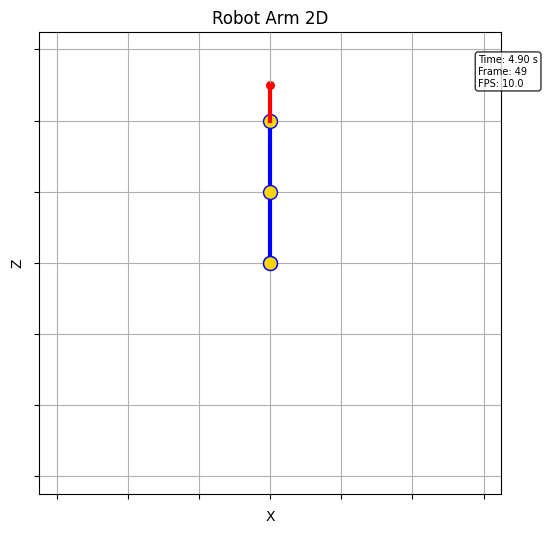

In [16]:
# スプライン関連
import numpy as np
from scipy.interpolate import PchipInterpolator, CubicSpline
import pinocchio as pin
import pyswarms as ps


# 軌跡からエネルギーを計算する関数
def compute_total_energy(model, data, qs, time_steps, dt):
    total_energy = 0.0

    for t in range(time_steps-1):
        q_current = qs[t]
        q_next = qs[t+1]
        dq = (q_next - q_current) / dt

        pin.computeAllTerms(model, data, q_current, dq)
        tau = pin.rnea(model, data, q_current, dq, np.zeros_like(dq))

        energy = np.sum(np.abs(tau * dq)) * dt
        total_energy += energy

    return total_energy

# qs_flat(T * nq)をqs_traj(T, nq)の形状を持つ軌跡データに成形
def reshape_qs_from_flat(qs_flat, time_steps, nq):
    assert qs_flat.shape[0] == time_steps * nq, "qs_flat must have shape (T * nq,)"
    return qs_flat.reshape((time_steps, nq))

# 0~1のランダムな値をモデルの関節の可動域に拡大
def expand_random_to_joint_limits(qs_norm, nq, limits=None):
    qs_expanded = np.zeros_like(qs_norm)
    if limits is None:
        lowers, uppers = model.lowerPositionLimit, model.upperPositionLimit
    else:
        lowers, uppers = limits[0], limits[1]
    for i in range(nq):
        lower, upper = lowers[i], uppers[i]
        qs_expanded[:, i] = lower + (upper - lower) * qs_norm[:, i]
    return qs_expanded

def random_q(model):
    nq = model.nq
    qs = np.random.rand(nq)
    return qs

# 毎ステップでランダムな関節角度を生成（使わない）
def random_qs(nq, time_steps, limits=None, seed=0):
    np.random.seed(seed)
    qs_flat = np.random.rand(time_steps * nq)
    qs_norm = reshape_qs_from_flat(qs_flat, time_steps, nq)
    return expand_random_to_joint_limits(qs_norm, model, limits=limits)

# 全関節で共通の可動域
def same_limits(nq, lower=-np.pi, upper=np.pi):
    lowers = [lower for _ in range(nq)]
    uppers = [upper for _ in range(nq)]
    limits = [lowers, uppers]
    return np.array(limits)

def random_qs_spline(model, time_steps, start, end, limits=None, num_knots=5, seed=0):
    # 始点と終点の形状を確認
    q_shape = pin.neutral(model).shape
    assert start.shape == q_shape, f"start.shape {start.shape} and end.shape {end.shape} must match model's q_shape {q_shape}"
    assert end.shape == q_shape, f"start.shape {start.shape} and end.shape {end.shape} must match model's q_shape {q_shape}"

    # ランダムシード初期化
    np.random.seed(seed)

    nq = model.nq

    # 可動域の設定
    if limits is None:
        lowers = model.lowerPositionLimit
        uppers = model.upperPositionLimit
    else:
        if len(limits) == 1:
            limits = same_limits(nq, lower=limits[0], upper=limits[1])
        lowers, uppers = limits
    lowers = np.array(lowers)
    uppers = np.array(uppers)

    # 始点と終点の範囲を確認
    # startのすべての関節角度に対して、それぞれが可動域に収まっていなければassertする。
    # endも同様

    # スプラインの制御点の時間軸
    control_times = np.linspace(0, time_steps-1, num=num_knots)
    times = np.arange(time_steps)

    # 関節ごとの軌跡を格納する配列
    qs = np.zeros((time_steps, nq))
    
    for j in range(nq):
        # 始点と終点を固定
        control_values = np.zeros(num_knots)
        control_values[0] = start[j]
        control_values[-1] = end[j]

        # 中間の制御点をランダムに生成
        control_values[1:-1] = np.random.uniform(lowers[j], uppers[j], num_knots-2)

        # CubicSpline補完
        # cs = PchipInterpolator(control_times, control_values)
        cs = CubicSpline(control_times, control_values, bc_type='clamped')

        # 時系列データ生成
        q_traj = cs(times)
        qs[:, j] = q_traj
    return qs

def qs_from_particle(particle, model, time_steps, start, end, limits, num_knots=5):
    """
    len(particle) = (num_knots - 2) * nq
    """
    # 始点と終点の形状を確認
    q_shape = pin.neutral(model).shape
    assert start.shape == q_shape, f"start.shape {start.shape} and end.shape {end.shape} must match model's q_shape {q_shape}"
    assert end.shape == q_shape, f"start.shape {start.shape} and end.shape {end.shape} must match model's q_shape {q_shape}"

    nq = model.nq

    # 可動域の設定
    if len(limits) == 1:
        limits = same_limits(nq, lower=limits[0], upper=limits[1])
    lowers, uppers = limits
    lowers = np.array(lowers)
    uppers = np.array(uppers)

    # 始点と終点の範囲を確認
    # startのすべての関節角度に対して、それぞれが可動域に収まっていなければassertする。
    # endも同様

    # スプラインの制御点の時間軸
    control_times = np.linspace(0, time_steps-1, num=num_knots)
    times = np.arange(time_steps)

    # 関節ごとの軌跡を格納する配列
    qs = np.zeros((time_steps, nq))
    
    for j in range(nq):
        # 始点と終点を固定
        control_values = np.zeros(num_knots)
        control_values[0] = start[j]
        control_values[-1] = end[j]

        # particleを中間の制御点に設定
        control_values[1:-1] = particle[(num_knots-2)*j:(num_knots-2)*(j+1)]

        # CubicSpline補完
        cs = PchipInterpolator(control_times, control_values)
        # cs = CubicSpline(control_times, control_values, bc_type='clamped')

        # 時系列データ生成
        q_traj = cs(times)
        qs[:, j] = q_traj
    return qs

# 例
time_steps = 50
dt = 0.02
qz = pin.neutral(model)
start, end = qz, np.ones_like(qz)*np.pi*2
energies = []
for seed in range(10):
    qs = random_qs_spline(model, time_steps, start, end, same_limits(model.nq),seed=seed)
    energy = compute_total_energy(model,data,qs,time_steps,dt)
    print(f"energy({seed}): {energy}")
    energies.append(energy)
max(energies)
plot_robot_motion(model, qs, is_3d=False)


In [17]:
# 最適化関連
import numpy as np
from scipy.interpolate import PchipInterpolator, CubicSpline
import pinocchio as pin
import pyswarms as ps
from functools import partial

# 軌跡からエネルギーを計算する関数
def compute_total_energy(model, data, qs, time_steps, dt):
    total_energy = 0.0

    for t in range(time_steps-1):
        q_current = qs[t]
        q_next = qs[t+1]
        dq = (q_next - q_current) / dt

        pin.computeAllTerms(model, data, q_current, dq)
        tau = pin.rnea(model, data, q_current, dq, np.zeros_like(dq))

        energy = np.sum(np.abs(tau * dq)) * dt
        total_energy += energy

    return total_energy


# 軌跡からジャークを計算する関数
def compute_total_jerk(qs, dt):
    ddq = np.diff(qs, n=2, axis=0) / (dt**2)
    dddq = np.diff(ddq, n=1, axis=0) / dt
    jerk_cost = np.sum(dddq**2) * dt
    return jerk_cost


# 一次元

# 粒子群最適化用の目的関数
# エネルギーのみ
def objective_energy(particles, model, data, start, end, limits, time_steps, dt, num_knots):
    # particles.shape = (n_particles, dimensions)
    costs = []
    for particle in particles:
        # particle.shape = ((num_knots - 2)*nq,)
        # フラットなベクトルを(time_steps, nq)に変換
        qs = qs_from_particle(particle,
                              model=model,
                              time_steps=time_steps,
                              start=start,
                              end=end,
                              limits=limits,
                              num_knots=num_knots)
        cost = compute_total_energy(model, data, qs, time_steps, dt)
        costs.append(cost)
    return np.array(costs)

def objective_jerk(particles, model, data, start, end, limits, time_steps, dt, num_knots):
    # particles.shape = (n_particles, dimensions)
    costs = []
    for particle in particles:
        # particle.shape = ((num_knots - 2)*nq,)
        # フラットなベクトルを(time_steps, nq)に変換
        qs = qs_from_particle(particle,
                              model=model,
                              time_steps=time_steps,
                              start=start,
                              end=end,
                              limits=limits,
                              num_knots=num_knots)
        cost = compute_total_jerk(qs, dt) + compute_total_energy(model,data,qs,time_steps,dt)
        costs.append(cost)
    return np.array(costs)

def optimize_energy(model, data, start, end, limits, time_steps, dt, num_knots=5, n_particles=30):
    dimensions = (num_knots - 2) * model.nq
    options = {'c1': 1.5, 'c2': 1.5, 'w': 0.9}
    optimizer = ps.single.GlobalBestPSO(n_particles=n_particles, dimensions=dimensions, options=options)

    # partialでほかの引数をバインド
    obj_func = partial(objective_energy,
                       model=model,
                       data=data,
                       start=start,
                       end=end,
                       limits=limits,
                       time_steps=time_steps,
                       dt=dt,
                       num_knots=num_knots)
    
    best_cost, best_pos = optimizer.optimize(obj_func, iters=100)
    return best_cost, best_pos

def optimize_jerk(model, data, start, end, limits, time_steps, dt, num_knots=5, n_particles=30):
    dimensions = (num_knots - 2) * model.nq
    options = {'c1': 1.5, 'c2': 1.5, 'w': 0.9}
    optimizer = ps.single.GlobalBestPSO(n_particles=n_particles, dimensions=dimensions, options=options)

    # partialでほかの引数をバインド
    obj_func = partial(objective_jerk,
                       model=model,
                       data=data,
                       start=start,
                       end=end,
                       limits=limits,
                       time_steps=time_steps,
                       dt=dt,
                       num_knots=num_knots)
    
    best_cost, best_pos = optimizer.optimize(obj_func, iters=100)
    return best_cost, best_pos


2025-06-16 17:10:31,151 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=122  
2025-06-16 17:10:45,701 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 122.4745690939724, best pos: [0.69032269 1.57033759 3.1924208  1.80358526 2.83855639 4.38656714
 1.71140609 2.79358098 4.22043078]
2025-06-16 17:10:45,712 - matplotlib.animation - INFO - Animation.save using <class 'matplotlib.animation.HTMLWriter'>


not saved


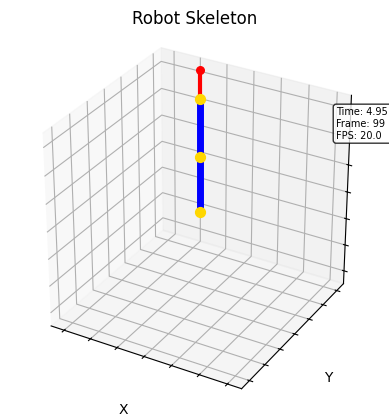

In [18]:

# 例
pi = np.pi
tau = 2*pi
time_steps = 100
dt = 0.05
qz = pin.neutral(model)
start = qz
# end = np.array([pi,pi,pi])
end = np.ones_like(start)*tau
limits = same_limits(model.nq)
num_knots = 5
best_cost, best_particle = optimize_jerk(model,data,start,end,limits,time_steps,dt,n_particles=100)
qs = qs_from_particle(best_particle,
                      model=model,
                      time_steps=time_steps,
                      start=start,
                      end=end,
                      limits=limits,
                      num_knots=num_knots)
# print("最適コスト:", best_cost)
# print("最適軌道形状:", qs)
plot_robot_motion(model,qs,dt=dt)


In [19]:
from pymdp import utils
import numpy as np
from scipy.stats import norm
import math
from pymdp.maths import softmax

import jax.numpy as jnp
import jax.tree_util as jtu
from jax import random as jr, config, jit
from pymdp.jax.agent import Agent as AIFAgent
from functools import partial
from equinox import tree_at

from pymdp.jax.maths import log_stable
import jax

# import pyglet
# from pyglet import shapes
import jax.numpy as jnp
from jax import jit

import matplotlib.pyplot as plt
import numpy as np 

import jax.numpy as jnp

from jax import jit
from jax.tree_util import tree_map
from functools import partial
import jax.random as jr

# config.update("jax_default_matmul_precision", "float32")
#config.update('jax_platform_name', 'cpu') # GPU使用可能環境下において、CPUで動かすときは実行する

#check jax
print(f'JAX v{jax.__version__} backend: {jax.default_backend()}')
print("devices:", jax.devices())


INFO:2025-06-16 17:10:55,971:jax._src.xla_bridge:749: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory
2025-06-16 17:10:55,971 - jax._src.xla_bridge - INFO - Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory
2025-06-16 17:10:55,973 - jax._src.xla_bridge - WARNING - An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


JAX v0.6.1 backend: cpu
devices: [CpuDevice(id=0)]


In [264]:
# num_obs, 
import os
import pickle
import time
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import softmax
from scipy.stats import vonmises
import seaborn as sns
from pymdp import utils
import jax.tree_util as jtu
from tqdm import tqdm

class RobotPerceptor:
    """
    ロボットの認識を行うクラス
    """
    def __init__(
            self,
            num_obs,
            num_states=None,
            batch_size:int=1,
            num_history:int=16,
            Ainit='diagonal',
            Binit='diagonal',
            Dinit='sigmoid',
            modality_per_joint:int=None,
            sincos_encoding:bool=False
    ):
        # 生成モデルのパラメータ
        self.num_obs = num_obs
        self.num_modalities = len(num_obs)
        if num_states is None:
            num_states = num_obs
        else:
            self.num_states = num_states
        self.num_factors = len(num_states)
        self.num_controls = [1 for _ in range(self.num_factors)]

        # その他のパラメータ
        self.batch_size = batch_size # バッチサイズ
        self.num_history = num_history # 考慮する履歴の長さ
        self.modality_per_joint = modality_per_joint # 各関節のモダリティ数
        self.sincos_encoding = sincos_encoding # Trueならば角度にsincosエンコーディングを使用
        self.dof = len(self.num_obs) // self.modality_per_joint # ロボットの自由度
        # ロボットの自由度（DoF）と状態変数の個数の整合性チェック
        # 例：状態変数が6個、自由度が3ならばOK（3で割り切れる）
        assert self.num_factors % self.modality_per_joint == 0, "num_factors must be divisible by dof"

        # A,Bの依存関係を定義
        self.A_dependencies = [[f] for f in range(self.num_modalities)] # A行列の依存関係を定義

        # B行列の依存関係を定義
        # if sincos_encoding:
        #     assert self.modality_per_joint >= 2
        #     if self.modality_per_joint <= 2:
        #         dep_joint
        #         dep_joint = [[i-1, i] for i in range(1, self.modality_per_joint)]
        #     else:
        #         dep_joint = [[0,1], [0,1], [0,1,2]] + [[i-1, i] for i in range(3, self.modality_per_joint)] if self.modality_per_joint > 2 else [[0,1], [0,1]]
        # else:
        #     dep_joint = [[0]] + [[i-1, i] for i in range(1, self.modality_per_joint)]

        # self.B_dependencies = [[d + self.modality_per_joint*j for d in subdep] for j in range(self.dof) for subdep in dep_joint]

        self.B_dependencies = [[i] for i in range(self.num_factors)] # agents.compute_expected_stateが複雑な依存関係に対応していないので、ここではNoneに設定

        # 生成モデルを初期化
        self.Ainit = Ainit
        self.Binit = Binit
        self.Dinit = Dinit
        self.initialize_A()
        self.initialize_B()
        self.initialize_C()
        self.initialize_D()
        self.initialize_pA()
        self.initialize_pB()

        # エージェントを初期化
        self.construct_agents()

        # 行動、観測、状態の初期化
        self.actions_t = 0 # 初期時刻では行動は未定義
        self.actions = None # 過去の行動
        self.observations = None # 過去の観測
        self.outcomes = None # 過去の観測

        # 推論のための引数（信念）の初期化
        self.infer_args = [self.agents.D, None] # [事前信念, 過去の状態(認識)]
        
        # 履歴を保存するリストの初期化
        self.vfe_hist = [] # 変分自由エネルギーの時系列データ
        self.kld_hist = [] # Kullback-Leibler divergenceの時系列データ
        self.bs_hist = [] # ベイジアンサプライズの結果の時系列データ
        self.un_hist = [] # 不確実性の時系列データ
        self.obs_hist = [] # 観測の時系列データ
        self.qs_hist = [] # 状態(認識)の時系列データ
        self.beliefs_hist = [] #信念の時系列データ
        self.actions_hist = [] # 行動の時系列データ
        self.A_hist = [] # A行列の時系列データ
        self.B_hist = [] # B行列の時系列データ

        self.FEparam = None # 変分自由エネルギーのパラメータを格納する辞書型データ


        
    def initialize_A(self):
        A_shapes = [[no] + [self.num_states[fidx] for _, fidx in enumerate(self.A_dependencies[m])] for m, no in enumerate(self.num_obs)]
        if self.Ainit == 'flat':
            # 均一なAで初期化
            A = utils.obj_array_zeros(A_shapes)
            A = A + 1
            self.A = utils.norm_dist_obj_arr(A)
        elif self.Ainit == 'diagonal':
            # 対角行列で初期化
            A = utils.obj_array_zeros(A_shapes)
            for m in range(self.num_modalities):
                no = self.num_obs[m]
                for f, _ in enumerate(self.A_dependencies[m]):
                    ns = self.num_states[f]
                    for o in range(no):
                        for s in range(ns):
                            delta = np.abs(s-o)
                            if delta > ns/2:
                                delta = ns - delta
                            kappa = 2.0
                            A[m][o,s] = np.exp(kappa * np.cos(2 * np.pi * delta / ns))+0.01
            self.A = utils.norm_dist_obj_arr(A)
        else:
            assert False, ("Ainit must be 'flat' or 'diagonal'")
        self.A_jax = jtu.tree_map(lambda x: jnp.broadcast_to(x, (self.batch_size,) + x.shape), list(self.A))
        return self.A

    def initialize_B(self):
        if self.Binit == 'flat':
            # 均一なBで初期化
            B_shapes = [[ns] + [self.num_states[fidx] for _, fidx in enumerate(self.B_dependencies[f])] + [self.num_controls[f]] for f, ns in enumerate(self.num_states)]
            B = utils.obj_array_zeros(B_shapes)
            B = B + 1
            B = utils.norm_dist_obj_arr(B)
        elif self.Binit == 'random':
            # ランダムなBで初期化
            B = utils.random_B_matrix(self.num_states, self.num_controls, self.B_dependencies)
        elif self.Binit == 'diagonal':
            # 対角行列で初期化
            self.B_dependencies = [[f] for f in range(self.num_factors)]
            B = utils.initialize_empty_B(self.num_states, self.num_controls)
            for f in range(self.num_factors):
                ns = self.num_states[f]
                for s1 in range(ns):
                    for s2 in range(ns):
                        delta = abs(s1 - s2)

                        # von mises分布
                        # kappa = 2.0
                        # B[f][s1,s2] = np.exp(kappa * np.cos(2 * np.pi * delta / ns))

                        # 正規分布
                        sigma = 1.0  # 標準偏差は適宜調整
                        B[f][s1, s2] = np.exp(- (delta ** 2) / (2 * sigma ** 2))
        else:
            assert False, ("Binit must be 'flat' or 'random' or 'diagonal'")
        self.B = B
        self.B_jax = jtu.tree_map(lambda x: jnp.broadcast_to(x, (self.batch_size,) + x.shape), list(self.B))
        return self.B
    
    def initialize_D(self, gain=5.0):
        if self.Dinit == 'flat':
            # 均一なDで初期化
            D = utils.obj_array_ones([ns for ns in self.num_states])
        elif self.Dinit == 'sigmoid':
            # シグモイド型のDを定義
            D = utils.obj_array_ones([ns for ns in self.num_states])
            for i, _ in enumerate(self.num_states):
                x = np.linspace(-1, 1, len(D[i]))  # 入力範囲を[-1, 1]に設定
                D[i] = 1 / (1 + np.exp(-gain * x))  # シグモイド関数の適用
                D[i] /= np.sum(D[i])  # 正規化
        else:
            assert False, ("Dinit must be 'flat' or 'sigmoid'")
        self.D = D
        self.D_jax = jtu.tree_map(lambda x: jnp.broadcast_to(x, (self.batch_size,) + x.shape), list(self.D))
        return self.D
    
    def initialize_C(self):
        # 均一なCで初期化(選好なし)
        self.C = utils.obj_array_zeros([num_ob for num_ob in self.num_obs])
        self.C_jax = jtu.tree_map(lambda x: jnp.broadcast_to(x, (self.batch_size,) + x.shape), list(self.C))
        return self.C
    
    def initialize_pA(self):
        # Aと同じ形のpAをディリクレ分布で初期化
        self.pA = utils.dirichlet_like(self.A)
        self.pA_jax = jtu.tree_map(lambda x: jnp.broadcast_to(x, (self.batch_size,) + x.shape), list(self.pA))
        return self.pA
    
    def initialize_pB(self):
        # Bと同じ形のpBをディリクレ分布で初期化
        self.pB = utils.dirichlet_like(self.B)
        self.pB_jax = jtu.tree_map(lambda x: jnp.broadcast_to(x, (self.batch_size,) + x.shape), list(self.pB))
        return self.pB   

    def print_info(self):
        print("RobotPerceptor Info:")
        print(f"  num_obs: {self.num_obs}")
        print(f"  num_states: {self.num_states}")
        print(f"  num_factors: {self.num_factors}")
        print(f"  num_controls: {self.num_controls}")
        print(f"  batch_size: {self.batch_size}")
        print(f"  num_history: {self.num_history}")
        print(f"  modality_per_joint: {self.modality_per_joint}")
        print(f"  sincos_encoding: {self.sincos_encoding}")
        print(f"  Ainit: {self.Ainit}")
        print(f"  Binit: {self.Binit}")
        print(f"  Dinit: {self.Dinit}")
    
    def construct_agents(self):
        self.agents = AIFAgent(
            A=self.A_jax,
            B=self.B_jax,
            C=self.C_jax,
            D=self.D_jax,
            E=None,
            pA=self.pA_jax,
            pB=self.pB_jax,
            A_dependencies=self.A_dependencies,
            B_dependencies=self.B_dependencies,
            onehot_obs=True,
            inference_algo="mmp"
        )

    def run_perception(self, timesteps, env, savedir="./test_data", filename=None):
        """
        環境を観測し、認識を行う
        :param timesteps: 観測する時間ステップ数
        :param env: 環境オブジェクト
        :return: 認識結果のリスト
        """
        batch_keys = jr.split(jr.PRNGKey(0), self.batch_size)
        start_time = time.time()
        # 環境の時刻を初期化
        T = 0

        for _ in tqdm(range(timesteps), desc="Perception Loop", position=0, leave=False):
            # 環境から観測を取得
            obs = env.current_obs(T)
            # 履歴に記録
            self.obs_hist.append(obs)
            # バッチに合わせて観測を整形
            outcome_t = [jnp.expand_dims(jnp.expand_dims(o, 0), 0).astype(jnp.float32) for o in obs]
            if self.outcomes is None:
                self.outcomes = outcome_t
            else:
                self.outcomes = jtu.tree_map(lambda prev_o, new_o: jnp.concatenate([prev_o, new_o], 1), self.outcomes, outcome_t)

            # エージェントを更新
            (
                self.agents,
                self.outcomes,
                self.actions,
                self.infer_args,
                batch_keys,
                self.FEparam,
                self.beliefs_orig,
                self.beliefs
            ) = update_agent(
                self.agents,
                self.outcomes,
                self.actions,
                self.infer_args,
                batch_keys,
                batch_size=self.batch_size,
                num_history=self.num_history
            )

            # 履歴に保存
            # vfe関係
            self.vfe_hist.append(self.FEparam['vfe'])
            self.kld_hist.append(self.FEparam['kld'])
            self.bs_hist.append(self.FEparam['bs'])
            self.un_hist.append(self.FEparam['un'])
            # 観測、状態、行動の履歴
            self.obs_hist.append(self.observations)
            self.qs_hist.append(self.infer_args[1][-1])
            self.actions_hist.append(self.actions)
            self.A_hist.append(self.agents.A)
            self.B_hist.append(self.agents.B)

            # 時間ステップを更新
            T += 1

            if T == timesteps:
                break
        
        # タスク終了時の処理
        end_time = time.time()
        elapsed_time = end_time - start_time
        print(f"Perception completed in {elapsed_time:.2f} seconds.")

        if T == timesteps:
            os.makedirs(savedir, exist_ok=True)
            if filename is None:
                # 現在の時刻を取得してファイル名に追加
                self.timestamp = time.strftime("%Y%m%d-%H%M%S", time.localtime())
                self.filepath = savedir + f"test_{self.timestam}.pickle"
            else:
                self.filepath = savedir + filename
            # 認識結果を保存
            with open(self.filepath, mode='wb') as fo:
                pickle.dump(self, fo)
            print(f"\rMetadata saved to '{self.filepath}")
        return
    
    def plot_fe_all(
            self,
            filename=None,
            vfe=True,
            kld=True,
            bs=True,
            un=True,
            ):
        # データの取得
        # 保存したpickleファイルを読み込む
        if filename is not None:
            try:
                with open(filename, mode='rb') as fi:
                    loaded_data = pickle.load(fi)
                # データの取得
                vfes = loaded_data.get('vfes', [])
                kld_history = loaded_data.get('kld_history', [])
                bs_history = loaded_data.get('bs_history', [])
                un_history = loaded_data.get('un_history', [])
            except FileExistsError:
                print(f"file '{filename} not found.")
            except Exception as e:
                print(f"An error occurred: {e}")
        # または現在保持しているデータ
        else:
            vfes = self.vfe_hist
            kld_history = self.kld_hist
            bs_history = self.bs_hist
            un_history = self.un_hist

        vfes = vfes[:][-1][0]
        kld_history = kld_history[:][-1][0]
        bs_history = bs_history[:][-1][0]
        un_history = un_history[:][-1][0]


                # 自由エネルギーのプロット
        if vfe or kld or bs or un:
            plt.figure(figsize=(10, 5))
            # vfeのプロット
            if vfe or kld or bs or un:
                if vfe:
                    plt.plot(range(len(vfes)), vfes, label="VFE", color='orange')
                if kld:
                    plt.plot(range(len(kld_history)), kld_history, label="KLD", linestyle='dashed', color='red')
                if bs:
                    plt.plot(range(len(bs_history)), bs_history, label="BS", linestyle='dashed', color='blue')
                if un:
                    plt.plot(range(len(un_history)), un_history, label="UN", linestyle='dashed', color='grey')

                plt.xlabel("Time Steps")
                plt.ylabel("VFE and Components")
                plt.title("VFE and Its Components Over Time")
                plt.legend()
                plt.grid()
                plt.show()


        


# エージェントの更新関数
@partial(jit, static_argnames=['batch_size', 'num_history'])
def update_agent(
    agents,
    observations,
    actions,
    infer_args,
    batch_keys,
    batch_size=1,
    num_history=16
):
    beliefs, err, vfe, kld2, bs, un = agents.infer_states_vfe(
        observations,
        infer_args[0],
        past_actions=actions,
        qs_hist=infer_args[1]
    )
    beliefs_orig = beliefs  # 元の信念を保存

    # vfe, bs, unをすべての状態因子について足し合わせる
    vfe = jnp.sum(jnp.stack(jtu.tree_leaves(vfe), axis=0), axis=0)
    bs = jnp.sum(jnp.stack(jtu.tree_leaves(bs), axis=0), axis=0)
    un = jnp.sum(jnp.stack(jtu.tree_leaves(un), axis=0), axis=0)

    # kldの計算
    # kldはすべての状態について足し合わせたものを得る
    # kld.shape = (batch_size, T(0<T<=16))
    kld = agents.calc_KLD_past_currentqs(infer_args[0], infer_args[1], beliefs_orig)

    # バッチサイズに基づいてランダムキーを分割
    batch_keys = jr.split(batch_keys[0], batch_size)
    # 行動をサンプリング
    dummy_q_pi, _neg_efe = agents.infer_policies(beliefs)
    next_action = jnp.zeros((dummy_q_pi.shape[0], len(agents.num_controls)), dtype=int)
    if actions is not None:
        actions = jnp.concatenate([actions, jnp.expand_dims(next_action, -2)], -2)
    else:
        actions = jnp.expand_dims(next_action, -2)

    # 観測、信念、行動の履歴を更新
    observations = tree_map(lambda x: x[:, -num_history:], observations)
    beliefs = tree_map(lambda x: x[:, -num_history:], beliefs)
    actions = tree_map(lambda x: x[:, -num_history:], actions)

    # Dの更新
    agents = tree_at(lambda x: x.D, agents, tree_map(lambda x: x[:, 0], beliefs))
    
    # 次の推論のために事前信念を更新
    if infer_args[1] is None:
        empirical_prior = infer_args[0]
    else:
        empirical_prior = agents.compute_expected_state(next_action, infer_args[1])
    infer_args[0] = empirical_prior
    infer_args[1] = beliefs

    return agents, observations, actions, infer_args, batch_keys, {
        'vfe': vfe,
        'kld': kld,
        'bs': bs,
        'un': un,
    }, beliefs_orig, beliefs



In [271]:
from robot import *
model = get_simple_arm(dof = 3)
data = model.createData()
nq = model.nq # ロボットの自由度
qz = pin.neutral(model)
start, end = qz, np.ones_like(qz)*np.pi*2
qs = random_qs_spline(model, time_steps, start, end)

# 感性評価の準備
# 観測の次元
num_obs_per_joint = [3,3,3]
num_obs = []
for i in range(nq):
    num_obs += num_obs_per_joint

# 生成する動きの長さ
time_steps = 30

# ロボットアームの環境を設定
rbt = RobotArmEnv(
    num_obs=num_obs,
    time_steps=time_steps,
    robot=model
)
dt = 0.05
rbt.computeAllobs(qs,dt)

self = RobotPerceptor(
    num_obs=num_obs,  # 各関節の観測数
    num_states=num_obs,  # 各関節の状態数
    batch_size=1,
    num_history=16,
    Ainit='diagonal',
    Binit='diagonal',
    modality_per_joint=3,
    sincos_encoding=False
)

self.print_info()

URDFファイルを ./robots/simple_arm_dof3.urdf に保存しました。自由度: 3
RobotPerceptor Info:
  num_obs: [3, 3, 3, 3, 3, 3, 3, 3, 3]
  num_states: [3, 3, 3, 3, 3, 3, 3, 3, 3]
  num_factors: 9
  num_controls: [1, 1, 1, 1, 1, 1, 1, 1, 1]
  batch_size: 1
  num_history: 16
  modality_per_joint: 3
  sincos_encoding: False
  Ainit: diagonal
  Binit: diagonal
  Dinit: sigmoid


In [272]:
self.run_perception(
    timesteps=time_steps,
    env=rbt,
    savedir="./test_data",
    filename="robot_perceptor_test.pickle"
)

Perception completed in 31.00 seconds.
Metadata saved to './test_datarobot_perceptor_test.pickle


In [275]:
vfe = self.vfe_hist
vfe[:][-1][0]

Array([5.328249 , 3.9631686, 3.8288026, 3.7313879, 4.158395 , 4.3852983,
       4.474658 , 4.472003 , 4.072876 , 3.945137 , 3.560944 , 4.2947392,
       5.8435616, 5.156632 , 3.5657563, 4.7017307, 3.0505874],      dtype=float32)

In [276]:
print(f"len(infer_args[1]: {len(self.infer_args[1])}")
print(f"infer_args[1][0].shape: {self.infer_args[1][0].shape}")
print(f"beliefs_orig[0].shape: {self.beliefs_orig[0].shape}")
print(f"beliefs[0].shape: {self.beliefs[0].shape}")
print(f"vfe[:][-1][0]: {self.vfe_hist[:][-1][0]}")
print(f"kld[:][-1][0]: {self.kld_hist[:][-1][0]}")

len(infer_args[1]: 9
infer_args[1][0].shape: (1, 16, 3)
beliefs_orig[0].shape: (1, 17, 3)
beliefs[0].shape: (1, 16, 3)
vfe[:][-1][0]: [5.328249  3.9631686 3.8288026 3.7313879 4.158395  4.3852983 4.474658
 4.472003  4.072876  3.945137  3.560944  4.2947392 5.8435616 5.156632
 3.5657563 4.7017307 3.0505874]
kld[:][-1][0]: [ 5.9306145e-02  1.6219914e-04  1.0430813e-07  1.3411045e-07
 -1.1920929e-07  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00 -1.7881393e-07
  4.4703484e-08 -2.9802322e-08  4.9814582e-05  3.5623744e-02
  2.6911215e+01]


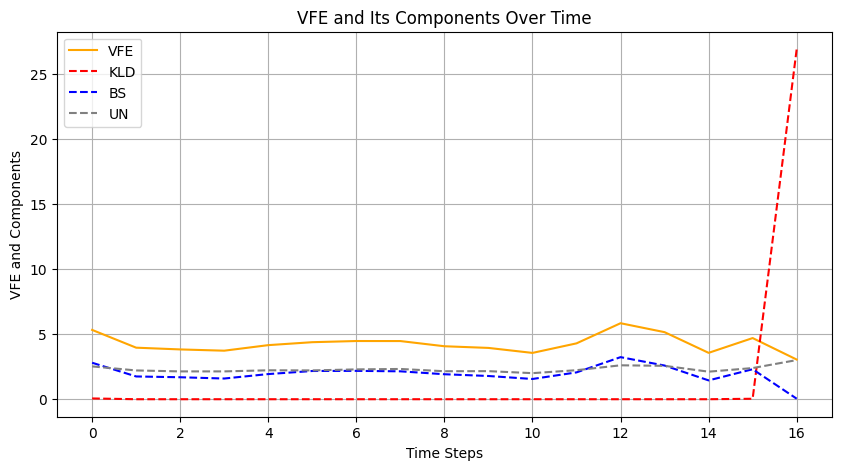

In [274]:
self.plot_fe_all()

In [ ]:
#SimulationManagerを定義
import os
import pickle
import time
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import softmax
from scipy.stats import vonmises
import seaborn as sns
from pymdp import utils
import jax.tree_util as jtu
from tqdm import tqdm


class SimulationManager:
    def __init__(
            self,
            num_obs,
            num_states=None,
            num_controls=None,
            batch_size:int=1,
            num_history:int=16,
            isLearning: bool=True,
            isActive: bool=False,
            lr_pA:float=1.0,
            lr_pB:float=1.0,
            learn_A=True,
            learn_B=True,
            learn_D=False,
            Ainit='diagonal',
            Binit='random',
            modality_per_joint:int=None,
            sincos_encoding:bool=False
            ):
        # # リンク機構のパラメータ
        # self.dof = 2 # 自由度

        # 生成モデルのパラメータ
        if num_obs is None:
            self.num_obs = [10,10,10,10,10,10,10,10] # 観測の次元数
        else:
            self.num_obs = num_obs
        self.num_modalities = len(self.num_obs) # 観測のモダリティ数
        if num_states is None:
            self.num_states = self.num_obs # 状態の次元数
        else:
            self.num_states = num_states
        self.num_factors = len(self.num_states) # 状態のファクタ数
        if num_controls is None:
            self.num_controls = [1 for _ in range(self.num_factors)] # 制御の次元数(制御なし)
        else:
            self.num_controls = num_controls

        # jointごとの観測モダリティ数
        if modality_per_joint is None:
            self.modality_per_joint = 4 if sincos_encoding else 3
        else:
            self.modality_per_joint = modality_per_joint

        self.dof = len(num_obs) // self.modality_per_joint# 自由度
        self.sincos_encoding = sincos_encoding

        # num_obsとnum_statesの形状を確認
        assert len(self.num_obs) == len(self.num_states), ("num_obs and num_states must be the same length")
        
        # 学習のパラメータ
        self.isActive  = isActive
        self.batch_size = batch_size # バッチサイズ
        self.num_history = num_history #  最大の履歴数（過去の状態・行動・観測を保持する数）
        self.lr_pA = lr_pA # Bの学習率
        self.lr_pB = lr_pB # Aの学習率
        self.learn_A = learn_A
        self.learn_B = learn_B
        self.learn_D = learn_D
        self.q_pi = None # ちゃんと定義して期待自由エネルギも計算するようにしたい

        # A,Bの依存関係を定義
        self.A_dependencies = [[f] for f in range(self.num_factors)] # A行列の依存関係を定義

        mod = self.modality_per_joint
        if sincos_encoding:
            base = [[0, 1], [0, 1], [0, 1, 2], [2, 3]]
        else:
            base = [[0], [0,1], [1,2]]

        result = [ [v + mod*j for v in sublist] for j in range(self.dof) for sublist in base ]
        self.B_dependencies = result
        # print(f"num_factors: {self.num_factors}\nBdep: {result}")

        # if isActive:
        #     self.B_dependencies = [[f//n*n+i for i in range(n)] + [self.num_factors+f//n] for f in range(self.num_factors)] # B行列の依存関係を定義
        # self.B_dependencies = [[f//n*n+i for i in range(n)] for f in range(self.num_factors)] # B行列の依存関係を定義      
        
        # self.B_dependencies = [[0,1], [0,1], [0,1,2], [1,2,3], [4,5], [4,5], [4,5,6], [5,6,7]]
        # print(f"B_dependencies: {self.B_dependencies}")


        # 生成モデルを初期化
        self.Ainit = Ainit
        self.Binit = Binit
        self.initialize_A()
        self.initialize_B()
        self.initialize_C()
        self.initialize_D()
        self.initialize_pA()
        self.initialize_pB()

        for m in range(self.num_modalities):
            factor_dims = tuple([self.num_states[f] for f in self.A_dependencies[m]])
            # print(f"factor_dims: {factor_dims}\nA[m].shape: {self.A_jax[m].shape[2:]}")
            assert self.A_jax[m].shape[2:] == factor_dims, f"Please input an `A_dependencies` whose {m}-th indices correspond to the hidden state factors that line up with lagging dimensions of A[{m}]..."   
        for f in range(self.num_factors):
            factor_dims = tuple([self.num_states[f] for f in self.B_dependencies[f]])
            # print(f"factor_dims: {factor_dims}\nB[f].shape: {self.B_jax[f].shape[2:-1]}")
            assert self.B_jax[f].shape[2:-1] == factor_dims, f"Please input a `B_dependencies` whose {f}-th indices pick out the hidden state factors that line up with the all-but-final lagging dimensions of B[{f}]..." 
            
        # エージェントを初期化
        self.construct_agents()
        self.beliefs_last = np.ones((1, 1, self.num_states[0]), dtype=np.float32)  # 信念状態（qs）を 1 で初期化
        self.q_pi = utils.norm_dist_obj_arr(np.ones(self.num_controls)) # 各アクションの確率を均等に正規化
        
        # シミュレーションを初期化
        self.actions_t = 0  # 初期時刻では行動は未定義
        self.actions = None  # 過去の行動（初期時点では空）
        self.outcomes = None  # 過去の観測（初期時点では空）

        self.T: int = 0  # 現在の時刻（シミュレーションステップ）
        self.simT: int = 0  # シミュレーション全体のタイムステップ数
        self.obs_history = []  # 観測の履歴を記録するリスト

        assert self.D_jax is not None, ("D_jax is not defined")
        self.infer_args = (self.D_jax, None,)  # 状態推定アルゴリズムに渡す引数（D_jax, qs_hist）
        
        # --- VFEとEFEの記録 ---
        self.vfes: list[float] = []  # 変分自由エネルギーの時系列データ
        self.kld_history = []  # Kullback-Leiblerダイバージェンスの時系列データ
        self.bs_history = []  # ベイズサプライズの時系列データ
        self.un_history = []  # 不確実性の時系列データ
        self.efes: list[float] = []  # 期待自由エネルギーの時系列データ
        self.utility_history = []  # 効用（Pragmatic value）の時系列データ
        self.state_info_gain_history = []  # 状態情報ゲイン（pBS）の時系列データ
        self.pA_info_gain_history = []  # 観測モデル情報ゲイン（A行列に関するNovelty）の時系列データ
        self.pB_info_gain_history = []  # 遷移モデル情報ゲイン（B行列に関するNovelty）の時系列データ
        self.inductive_value_history = []  # 帰納的価値（inductive inferenceで用いられる項）の時系列データ

        # --- 履歴リストの初期化 ---
        self.actions_history = []  # 行動の履歴を記録するリスト
        self.beliefs_history = []  # 信念の履歴を記録するリスト
        self.qs_history = []       # 認識の履歴を記録するリスト
        self.FEparam = None
        self.A_history = []
        self.B_history = []
        self.beliefs_traj_history = []

        # --- 学習設定 ---
        self.isLearning: bool = isLearning  # 学習の有効化（Falseに設定すると学習を無効化）
        Matrix_conpara_switch: bool = False  # モデル間の比較機能のスイッチ
        PauseFlag: bool = False  # 実行の一時停止フラグ


    def reset_simulation(self):
        """
        シミュレーションを初期化する関数
        """
        # シミュレーション設定
        self.actions_t = 0  # 初期時刻では行動は未定義
        self.actions = None  # 過去の行動（初期時点では空）
        self.outcomes = None  # 過去の観測（初期時点では空）

        self.T: int = 0  # 現在の時刻（シミュレーションステップ）
        self.simT: int = 0  # シミュレーション全体のタイムステップ数
        self.obs_history = []  # 観測の履歴を記録するリスト

        assert self.D_jax is not None, ("D_jax is not defined")
        self.infer_args = (self.D_jax, None,)  # 状態推定アルゴリズムに渡す引数（初期信念を含む）
        
        # --- VFEとEFEの記録 ---
        self.vfes: list[float] = []  # 変分自由エネルギーの時系列データ
        self.kld_history = []  # Kullback-Leiblerダイバージェンスの時系列データ
        self.bs_history = []  # ベイズサプライズの時系列データ
        self.un_history = []  # 不確実性の時系列データ
        #henkou
        self.efes: list[float] = []  # 期待自由エネルギーの時系列データ
        self.utility_history = []  # 効用（Pragmatic value）の時系列データ
        self.state_info_gain_history = []  # 状態情報ゲイン（pBS）の時系列データ
        self.pA_info_gain_history = []  # 観測モデル情報ゲイン（A行列に関するNovelty）の時系列データ
        self.pB_info_gain_history = []  # 遷移モデル情報ゲイン（B行列に関するNovelty）の時系列データ
        self.inductive_value_history = []  # 帰納的価値（inductive inferenceで用いられる項）の時系列データ

        # --- 履歴リストの初期化 ---
        self.actions_history = []  # 行動の履歴を記録するリスト
        self.beliefs_history = []  # 信念の履歴を記録するリスト
        self.qs_history = []       # 認識の履歴を記録するリスト
        self.FEparam = None

        self.A_history = []
        self.B_history = []
        self.beliefs_traj_history = [] # 信念の遷移の履歴

    #     # --- 学習設定 ---
    #     self.isLearning: bool = True  # 学習の有効化（Falseに設定すると学習を無効化）
    #     learningRateB: float = 1.0  # 状態遷移モデルの学習率
    #     Matrix_conpara_switch: bool = False  # モデル間の比較機能のスイッチ
    #     PauseFlag: bool = False  # 実行の一時停止フラグ

    # def initialize_GM(self, num_obs=None, num_states=None, num_controls=None, batch_size=None, default=False):
    #     """
    #     生成モデルを初期化する関数。
    #     シミュレーション結果は初期化しない。
    #     """
    #     # デフォルトの設定
    #     if default:
    #         self.num_obs = [10, 10]
    #         self.num_modalities = len(self.num_obs)
    #         self.num_states = [10, 10]
    #         self.num_factors = len(self.num_states)
    #         self.num_controls = [1 for _ in range(self.num_factors)]
    #         self.batch_size = 1

    #     # バッチサイズの設定
    #     if batch_size is not None:
    #         self.batch_size = batch_size
    #     else:
    #         batch_size = self.batch_size

    #     # 生成モデルの設定
    #     self.update_num_states_obs_controls(num_obs=num_obs, num_states=num_states, num_controls=num_controls)
    #     # 情報を表示
    #     if default:
    #         print("Default settings:")
    #     self.print_info()

    #     self.construct_agents()

    def reset_generative_model(self):
        """
        生成モデルを初期化する関数。
        シミュレーション結果は初期化しない。
        """
        self.initialize_A()
        self.initialize_B()
        self.initialize_C()
        self.initialize_D()
        self.initialize_pA()
        self.initialize_pB()

        # エージェントを再構築
        self.construct_agents()
        self.beliefs_last = np.ones((1, 1, self.num_states[0]), dtype=np.float32)  # 信念状態（qs）を 1 で初期化
        self.q_pi = utils.norm_dist_obj_arr(np.ones(self.num_controls)) # 各アクションの確率を均等に正規化

        # 情報を表示
        self.print_info()

    def update_lr(self, isLearning:bool=None, lr_pA=None, lr_pB=None):
        if isLearning is not None:
            self.isLearning = isLearning
        if lr_pA is not None:
            self.lr_pA = lr_pA
        if lr_pB is not None:
            self.lr_pB = lr_pB
        self.print_info()

    def initialize_A(self):
        A_shapes = [[no] + [self.num_states[fidx] for _, fidx in enumerate(self.A_dependencies[m])] for m, no in enumerate(self.num_obs)]
        if self.Ainit == 'flat':
            # 均一なAで初期化
            A = utils.obj_array_zeros(A_shapes)
            A = A + 1
            self.A = utils.norm_dist_obj_arr(A)
        elif self.Ainit == 'diagonal':
            # 対角行列で初期化
            A = utils.obj_array_zeros(A_shapes)
            for m in range(self.num_modalities):
                no = self.num_obs[m]
                for f, _ in enumerate(self.A_dependencies[m]):
                    ns = self.num_states[f]
                    for o in range(no):
                        for s in range(ns):
                            delta = np.abs(s-o)
                            if delta > ns/2:
                                delta = ns - delta
                            kappa = 2.0
                            A[m][o,s] = np.exp(kappa * np.cos(2 * np.pi * delta / ns))+0.01
            self.A = utils.norm_dist_obj_arr(A)
        else:
            assert False, ("Ainit must be 'flat' or 'diagonal'")
        # elif self.Ainit == 'random':
        #     # ランダムなAで初期化
        #     A = utils.random_A_matrix(self.num_obs, self.num_states)
        #     self.A = A
        # elif self.Ainit == 'diagonal':
        #     # 対角行列で初期化
        #     A = utils.initialize_empty_A(self.num_obs, self.num_states)
        #     for m, Am in enumerate(A):
        #         no = self.num_obs[m]
        #         for f in range(self.num_factors):
        #             ns = self.num_states[f]
        #             Amf = Am[f+1]
        #             for o in range(no):
        #                 for s in range(ns):
        #                     delta = np.abs(s-o)
        #                     if delta > ns/2:
        #                         delta = ns - delta
        #                     Amf[o,s] = 
                
        #         delta = np.abs(s - o)
        #         if delta > num_states / 2:
        #             delta = num_states - delta
        #         likelihood_tensor[o, s, m] = np.exp(kappa * np.cos(2 * np.pi * delta / num_states))

        #     A[] = 
        #     self.A = A
        self.A_jax = jtu.tree_map(lambda x: jnp.broadcast_to(x, (self.batch_size,) + x.shape), list(self.A))
        return self.A
    
    # def initialize_A(self, kappa=2.0):
    #     """
    #     von Mises分布ベースで観測尤度A行列を初期化する
    #     kappa: von Mises分布の集中度（大きいと鋭くなる）
    #     """
    #     num_states = self.num_states
    #     num_obs = self.num_obs
    #     A_shape_list = [[no] + num_states for no in num_obs]
    #     A = utils.obj_array(len(A_shape_list))

    #     for i, shape in enumerate(A_shape_list):
    #         A_i = np.zeros(shape)
    #         n_obs = num_obs[i]
    #         n_states = num_states[i]

    #         # 観測カテゴリ (0〜n_obs-1)
    #         obs_vals = np.arange(n_obs)

    #         for s in range(n_states):
    #             # 各状態sのときのvon Mises分布
    #             # 状態カテゴリ番号を中心とする循環分布
    #             pdf_vals = vonmises.pdf(obs_vals * 2*np.pi/n_obs, kappa, loc=s * 2*np.pi/n_obs)
    #             pdf_vals /= pdf_vals.sum()  # 念のため正規化

    #             # A行列の[観測, 状態]に代入
    #             A_i[:, s] = pdf_vals

    #         A[i] = A_i
    #     self.A = A
    #     self.A_jax = jtu.tree_map(lambda x: jnp.broadcast_to(x, (self.batch_size,) + x.shape), list(self.A))
    #     return self.A

    def initialize_B(self):
        if self.Binit == 'flat':
            # 均一なBで初期化
            B_shapes = [[ns] + [self.num_states[fidx] for _, fidx in enumerate(self.B_dependencies[f])] + [self.num_controls[f]] for f, ns in enumerate(self.num_states)]
            B = utils.obj_array_zeros(B_shapes)
            B = B + 1
            self.B = utils.norm_dist_obj_arr(B)
        elif self.Binit == 'random':
            B = utils.random_B_matrix(self.num_states, self.num_controls, self.B_dependencies)
            self.B = B
        elif self.Binit == 'diagonal':
            self.B_dependencies = [[f] for f in range(self.num_factors)]
            B = utils.initialize_empty_B(self.num_states, self.num_controls)
            for f in range(self.num_factors):
                ns = self.num_states[f]
                for s1 in range(ns):
                    for s2 in range(ns):
                        delta = abs(s1 - s2)

                        # von mises分布
                        # kappa = 2.0
                        # B[f][s1,s2] = np.exp(kappa * np.cos(2 * np.pi * delta / ns))

                        # 正規分布
                        sigma = 1.0  # 標準偏差は適宜調整
                        B[f][s1, s2] = np.exp(- (delta ** 2) / (2 * sigma ** 2))
            self.B = B

        else:
            assert False, ("Binit must be 'flat' or 'random' or 'diagonal'")
        self.B_jax = jtu.tree_map(lambda x: jnp.broadcast_to(x, (self.batch_size,) + x.shape), list(self.B))
        return self.B
    
    def initialize_D(self, gain=5.0):
        # シグモイド型のDを定義
        D = utils.obj_array_ones([ns for ns in self.num_states])
        for i, _ in enumerate(self.num_states):
            x = np.linspace(-1, 1, len(D[i]))  # 入力範囲を[-1, 1]に設定
            D[i] = 1 / (1 + np.exp(-gain * x))  # シグモイド関数の適用
            D[i] /= np.sum(D[i])  # 正規化
        self.D = D
        self.D_jax = jtu.tree_map(lambda x: jnp.broadcast_to(x, (self.batch_size,) + x.shape), list(self.D))
        return self.D
    
    def initialize_D_flat(self):
        D = utils.obj_array_ones([ns for ns in self.num_states])
        self.D = utils.norm_dist_obj_arr(D)
        return self.D
    
    def initialize_pA(self):
        # Aと同じ形のpAをディリクレ分布で初期化
        self.pA = utils.dirichlet_like(self.A)
        self.pA_jax = jtu.tree_map(lambda x: jnp.broadcast_to(x, (self.batch_size,) + x.shape), list(self.pA))
        return self.pA
    
    def initialize_pB(self):
        # Bと同じ形のpBをディリクレ分布で初期化
        self.pB = utils.dirichlet_like(self.B)
        self.pB_jax = jtu.tree_map(lambda x: jnp.broadcast_to(x, (self.batch_size,) + x.shape), list(self.pB))
        return self.pB

    def initialize_C(self):
        # 均一なCで初期化(選好なし)
        self.C = utils.obj_array_zeros([num_ob for num_ob in self.num_obs])
        self.C_jax = jtu.tree_map(lambda x: jnp.broadcast_to(x, (self.batch_size,) + x.shape), list(self.C))
        return self.C

    def print_info(self):
        print(f'num_obs : {self.num_obs}')
        print(f'num_modalities : {self.num_modalities}')
        print(f'num_states : {self.num_states}')
        print(f'num_factors : {self.num_factors}')
        print(f'num_controls : {self.num_controls}')
        print(f'A[0].shape : {self.A[0].shape}')
        print(f'B[0].shape : {self.B[0].shape}')
        print(f'C : {self.C}')
        print(f'D : {self.D}')
        print(f'pA[0].shape : {self.pA[0].shape}')
        print(f'pB[0].shape : {self.pB[0].shape}')
        print(f'A is normalized : {utils.is_normalized(self.A)}')
        print(f'B is normalized : {utils.is_normalized(self.B)}')
        print(f'beliefs_last : {self.beliefs_last}')
        print(f'q_pi : {self.q_pi}')

    def construct_agents(self):
        assert self.A_jax is not None, ("Generative Model is not defined")
        self.agents = AIFAgent(
            A=self.A_jax,
            B=self.B_jax,
            C=self.C_jax,
            D=self.D_jax,
            E=None,
            pA=self.pA_jax,
            pB=self.pB_jax,
            A_dependencies=self.A_dependencies,
            B_dependencies=self.B_dependencies,
            onehot_obs=True,
            inference_algo="mmp",
            learn_A=self.learn_A,
            learn_B=self.learn_B,
            learn_D=self.learn_D,
            
        )

    def run(self, timesteps, env, savedir="./test_data/", filename=None, debug=False):
        """
        timesteps: シミュレーションを行う時間ステップ数
        env: env.current_obs(time)を持つ環境クラス
        """

    
        assert self.agents is not None, ("agents is not defined")
        simT_max = timesteps
        batch_keys = jr.split(jr.PRNGKey(0), self.batch_size)

        start_time = time.time()

        # タスク実行ループ
        for _ in tqdm(range(simT_max+1), desc="観測中", leave=False, position=0):
            clockLB = time.time()
            clock = time.time()

            # 現在の観測を取得
            obs = env.current_obs(self.T)

            # 履歴に記録
            self.obs_history.append(obs)
            
            # 観測データを準備
            outcome_t = [jnp.expand_dims(jnp.expand_dims(o, 0), 0).astype(jnp.float32) for o in obs]

            # 観測履歴を更新
            if self.outcomes is None:
                self.outcomes = outcome_t
            else:
                self.outcomes = jtu.tree_map(lambda prev_o, new_o: jnp.concatenate([prev_o, new_o], 1), self.outcomes, outcome_t)

            # 能動推論エージェントを更新
            isLearning = self.isLearning
            # if self.lr_pA==0.0 and self.lr_pB==0.0:
            #     isLearning = False
            
            (
                self.agents,
                self.outcomes,
                self.actions,
                self.beliefs_last,
                self.infer_args,
                batch_keys,
                self.FEparam,
                self.q_pi,
                self.beliefs
            ) = update_agent(
                self.agents,
                self.outcomes,
                self.actions,
                self.infer_args,
                batch_keys,
                batch_size=self.batch_size,
                isLearning=isLearning,
                lr_pB=self.lr_pB,
                lr_pA=self.lr_pA,
                num_history=self.num_history
            )

            # 各種メトリクスを記録
            # vfe関係
            self.vfes.append(self.FEparam['vfe'][0][0][-1])
            self.kld_history.append(self.FEparam['kld'][0][0][-1])
            self.bs_history.append(self.FEparam['bs'][0][0][-1])
            self.un_history.append(self.FEparam['un'][0][0][-1])
            # efe関係
            self.efes.append([-val for val in self.FEparam['neg_efe'][0]])
            self.utility_history.append([-val for val in self.FEparam['utility'][0]])
            self.state_info_gain_history.append([-val for val in self.FEparam['state_info_gain'][0]])
            self.pA_info_gain_history.append([-val for val in self.FEparam['pA_info_gain'][0]])
            self.pB_info_gain_history.append([-val for val in self.FEparam['pB_info_gain'][0]])
            self.inductive_value_history.append([-val for val in self.FEparam['inductive_value'][0]])
            # 信念状態の履歴を更新
            self.beliefs_history.append(self.beliefs_last)
            # 認識の履歴を更新
            current_qs = self.infer_args[1][-1]
            self.qs_history.append(current_qs)

            # 最新の行動を取得（環境に影響させない）
            self.actions_t = int(self.actions[:, 1, 0].item())
            # 行動履歴を記録
            self.actions_history.append(self.actions_t)

            # 生成モデルのアーカイブ
            self.A_history.append(self.A_jax)
            self.B_history.append(self.B_jax)
            self.beliefs_traj_history.append(self.beliefs)


            # 時間ステップを更新
            self.T += 1
            self.simT += 1

            if self.simT >= simT_max:
                break

            loopTimeRecord = {'AIF': (time.time() - clock) * 1000, 'all': (time.time() - clockLB) * 1000}

        # --- タスク終了時の処理 ---
        end_time = time.time()
        execution_time = end_time - start_time
        if debug:
            print(f"\rTask completed in {execution_time:.2f} seconds.")

        # --- メタデータの保存処理 ---
        if self.simT > 0:
            savedata = {
                'B': jax.device_get(self.agents.B),
                'A': jax.device_get(self.agents.A),
                'pB': jax.device_get(self.agents.pB),
                'pA': jax.device_get(self.agents.pA),
                'infer_args': self.infer_args,
                'agents': self.agents,
                'simT': self.simT,
                'T': self.T,
                'vfes': self.vfes,
                'kld_history': self.kld_history,
                'bs_history': self.bs_history,
                'un_history': self.un_history,
                'efes': self.efes,
                'utility_history': self.utility_history,
                'state_info_gain_history': self.state_info_gain_history,
                'pA_info_gain_history': self.pA_info_gain_history,
                'pB_info_gain_history': self.pB_info_gain_history,
                'inductive_value_history': self.inductive_value_history,
                'actions_history': self.actions_history,
                'obs_history': self.obs_history,
                'beliefs_history': self.beliefs_history,
                'qs_history': self.qs_history,
                'isLearning': self.isLearning,
                'lr_pA': self.lr_pA,
                'lr_pB': self.lr_pB,
                'A_history': self.A_history,
                'B_history': self.B_history,
                'beliefs_traj_history': self.beliefs_traj_history
                }
            
            # 保存用フォルダがなければ作成
            os.makedirs(savedir, exist_ok=True)
            if filename is None:
                # 現在の時刻を取得してファイル名に追加
                self.timestamp = time.strftime("%y%m%d%H%M%S", time.localtime())
                self.filepath = savedir + f"test_{self.timestamp}.pickle"
            else:
                self.filepath = savedir + filename + ".pickle"

            with open(self.filepath, mode='wb') as fo:
                pickle.dump(savedata, fo)

            if debug:
                print(f"\rMetadata has been saved to '{self.filepath}'.")

    def plot_fe_all(
            self,
            filename=None,
            split_fe=True,
            vfe=True,
            kld=True,
            bs=True,
            un=True,
            efe=True,
            utility=True,
            state_ig=True,
            pA_ig=True,
            pB_ig=True,
            param_ig=True,
            inductive_val=True,
            actions=True,
            obs=True
            ):
        
        # データの取得
        # 保存したpickleファイルを読み込む
        if filename is not None:
            try:
                with open(filename, mode='rb') as fi:
                    loaded_data = pickle.load(fi)
                # データの取得
                vfes = loaded_data.get('vfes', [])
                efes = loaded_data.get('efes', [])
                kld_history = loaded_data.get('kld_history', [])
                bs_history = loaded_data.get('bs_history', [])
                un_history = loaded_data.get('un_history', [])
                utility_history = loaded_data.get('utility_history', [])
                state_info_gain_history = loaded_data.get('state_info_gain_history', [])
                pA_info_gain_history = loaded_data.get('pA_info_gain_history', [])
                pB_info_gain_history = loaded_data.get('pB_info_gain_history', [])
                inductive_value_history = loaded_data.get('inductive_value_history', [])  # Inductive Value の履歴を取得
                actions_history = loaded_data.get('actions_history', [])
                obs_history = loaded_data.get('obs_history', [])
                qs_history = loaded_data.get('qs_history', [])
            except FileExistsError:
                print(f"file '{filename} not found.")
            except Exception as e:
                print(f"An error occurred: {e}")

        # または現在保持しているデータ
        else:
            vfes = self.vfes
            efes = self.efes
            kld_history = self.kld_history
            bs_history = self.bs_history
            un_history = self.un_history
            utility_history = self.utility_history
            state_info_gain_history = self.state_info_gain_history
            pA_info_gain_history = self.pA_info_gain_history
            pB_info_gain_history = self.pB_info_gain_history
            inductive_value_history = self.inductive_value_history
            actions_history = self.actions_history
            obs_history = self.obs_history
            qs_history = self.qs_history

        # 自由エネルギーのプロット
        if vfe or kld or bs or un or efe or utility or state_ig or pA_ig or pB_ig or param_ig or inductive_val:
            plt.figure(figsize=(10, 5))
            # vfeのプロット
            if vfe or kld or bs or un:
                if vfe:
                    plt.plot(range(len(vfes)), vfes, label="VFE", color='orange')
                if kld:
                    plt.plot(range(len(kld_history)), kld_history, label="KLD", linestyle='dashed', color='red')
                if bs:
                    plt.plot(range(len(bs_history)), bs_history, label="BS", linestyle='dashed', color='blue')
                if un:
                    plt.plot(range(len(un_history)), un_history, label="UN", linestyle='dashed', color='grey')
                
                if split_fe: # efeと別でプロットする場合
                    plt.xlabel("Time Steps")
                    plt.ylabel("VFE and Components")
                    plt.title("VFE and Its Components Over Time")
                    plt.legend()
                    plt.grid()
                    plt.show()

            # efeのプロット
            if efe or utility or state_ig or pA_ig or pB_ig or param_ig or inductive_val:
                # 各指標の平均を計算
                efes_means = [np.mean(step) for step in efes]
                utility_means = [np.mean(step) for step in utility_history]
                state_info_gain_means = [np.mean(step) for step in state_info_gain_history]
                pA_info_gain_means = [-np.mean(step) for step in pA_info_gain_history]
                pB_info_gain_means = [-np.mean(step) for step in pB_info_gain_history]
                param_info_gain_means = [pA + pB for pA, pB in zip(pA_info_gain_means, pB_info_gain_means)]
                inductive_value_means = [np.mean(step) for step in inductive_value_history]  # Inductive Value の平均を計算
                
                if split_fe: # vfeと別でプロットする場合にもう一枚用意
                    plt.figure(figsize=(10, 5))

                if efe:
                    plt.plot(range(len(efes_means)), efes_means, label="EFE", color='lime')
                if utility:
                    plt.plot(range(len(utility_means)), utility_means, label="Utility", linestyle='dashed', color='gold')
                if state_ig:
                    plt.plot(range(len(state_info_gain_means)), state_info_gain_means, label="State Info Gain", linestyle='dashed', color='cyan')
                if pA_ig:
                    plt.plot(range(len(pA_info_gain_means)), pA_info_gain_means, label="Negative Novelty pA", linestyle='dashed', color='magenta')
                if pB_ig:
                    plt.plot(range(len(pB_info_gain_means)), pB_info_gain_means, label="Negative Novelty pB", linestyle='dashed', color='navy')
                if param_ig:
                    plt.plot(range(len(param_info_gain_means)), param_info_gain_means, label="Negative Novelty", linestyle='dashed', color='pink')
                if inductive_val:
                    plt.plot(range(len(inductive_value_means)), inductive_value_means, label="Inductive Value", linestyle='dashed', color='teal')

                if split_fe: # vfeと別でプロットする場合
                    plt.xlabel("Time Steps")
                    plt.ylabel("EFE and Components")
                    plt.title("EFE and Its Components Over Time")
                    plt.legend()
                    plt.grid()
                    plt.show()
                else:
                    plt.xlabel("Time Steps")
                    plt.ylabel("EFE and VFE")
                    plt.title("EFE and Its Components Over Time")
                    plt.legend()
                    plt.grid()
                    plt.show()

    def plot_A_all(self, batch_idx=0):
        # Aの形状はmodalityごとに(batch_size, [no] + [num_states])
        num_modalities = self.num_modalities
        num_factors = self.num_factors
        if num_modalities==1 and num_factors==1:
            A = self.agents.A[0][batch_idx,:,:]
            plt.figure(figsize=(10, 5))
            plt.title('Heatmap of A matrix')
            sns.heatmap(A, cmap="viridis")
            plt.xlabel('State Index')
            plt.ylabel('Observation Index')
            plt.gca().xaxis.set_major_locator(plt.MultipleLocator(5))
            plt.gca().yaxis.set_major_locator(plt.MultipleLocator(5))
            plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{int(x)}'))
            plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{int(y)}'))
            plt.show()
            return
        else:
            # サブプロットの作成。各ヒートマップのサイズを調整
            fig, axes = plt.subplots(num_modalities, num_factors, figsize=(4*num_factors, 3*num_modalities))
            plt.title('A matrix heatmaps')
            
            # axesが2次元の場合も、1行または1列の場合も対応
            if num_modalities == 1:
                axes = axes[None, :]  # 1行に変換
            if num_factors == 1:
                axes = axes[:, None]  # 1列に変換

            for m, Am in enumerate(self.agents.A):
                # Amを [no]+num_states の形状に取る(lenはnum_factors+1となる)
                Am = Am[batch_idx]
                for f in range(Am.shape[0]):
                    # Amの中でのfのインデックス
                    dim = f + 1 # 0はobsのインデックスなので+1
                    # 平均を取る軸を整理
                    avg_axes = tuple(i for i in range(1, len(Am.shape)) if i not in (0, dim))
                    ax = axes[m, f]
                    Amf = Am.mean(axis=avg_axes)
                    sns.heatmap(Amf, ax=ax, cmap="viridis", cbar=True)
                    ax.set_title(f"Modality {m} - Factor {f}")
                    ax.set_xlabel("State Index")
                    ax.set_ylabel("Observtion Index")
            plt.tight_layout()
            plt.show()



    def plot_B_all(self, batch_idx=0):
        # 縦にfactor数、横にそのfactorと関連するfactor数*control数(の最大値）を持つサブプロットを作成
        cols = [len(self.B_dependencies[f]) * self.num_controls[f] for f in range(self.num_factors)]
        max_cols = max(cols)
        # print(f"cols: {cols}")
        # print(f"max_cols: {max_cols}")
        w_per_subplot = 3  # 横の1プロットあたり幅
        h_per_subplot = 2.5  # 縦の1プロットあたり高さ

        fig_width = w_per_subplot * max_cols
        fig_height = h_per_subplot * self.num_factors

        fig, axes = plt.subplots(self.num_factors, max_cols, figsize=(fig_width, fig_height))
        # fig, axes = plt.subplots(self.num_factors, max_cols, figsize=(3*self.num_factors, 4))
        fontsize = 16
        fig.suptitle('B matrix heatmaps', fontsize=fontsize)

        # axesが2次元の場合も、1行または1列の場合も対応
        if self.num_factors == 1:
            axes = axes[None, :]  # 1行に変換
        if max_cols == 1:
            axes = axes[:, None]  # 1列に変換

        # 現在の状態を表すfactorごとにＢを取り出す
        for factor, B in enumerate(self.B_jax):
            nc = self.num_controls[factor]
            B = np.array(B[batch_idx])

            # num_controls[f]の数だけ制御の通り数があるので、各制御に対して
            for c in range(self.num_controls[factor]):
                # controlを表すcごとにBを取り出す
                Bc = B[..., c]
                # factorに関連するfactor（fとする）それぞれに対して
                for fidx, f in enumerate(self.B_dependencies[factor]):
                    num_depend = len(self.B_dependencies[factor])
                    row = factor
                    col = c * len(self.B_dependencies[factor]) + fidx
                    ax = axes[row, col]
                    # Bの先頭は状態軸、その次が依存先状態軸群
                    # 平均を取る軸を整理
                    avg_axes = tuple(i for i in range(Bc.ndim) if i not in (0, f%num_depend+1))
                    B_mat = Bc.mean(axis=avg_axes)
                    # print(f"f: {f}")
                    # print(f"Bc.ndim: {Bc.ndim}")
                    # print(f"avg_axes: {avg_axes}")
                    # print(f"Bc.shape: {Bc.shape}")
                    # print(f"Bfcs.shape: {B_mat.shape}")
                    # print(B_mat)
                    sns.heatmap(B_mat, ax=ax, cmap="viridis", cbar=True)
                    ax.set_title(f"Factor(y) {factor} - Factor(x) {f} (Control {c})")
                    ax.set_xlabel("Next State")
                    ax.set_ylabel("Current State")
        fig.tight_layout(rect=[0, 0.03, 1, 0.99])

        plt.show()
                    

            # for col in range(max_cols):
            #     ax = axes[f, col]
            #     # 該当factorにc番目のcontrolがあればプロット、なければ非表示にする
            #     if col < cols[f]:
            #         c = col % nc  # controlのインデックス
            #         s = col // nc  # 状態のインデックス
            #         Bfc = Bf[..., c]
            #         # Bfの先頭は状態軸、その次が依存先状態軸群、最後がcontrol
            #         avg_axes = tuple(i for i in range(1, Bfc.ndim) if i not in (0, s))
            #         Bfcs = Bfc.mean(axis=avg_axes)
            #         print(f"Bfcs.shape: {Bfcs.shape}")
            #         print(Bfcs)
            #         sns.heatmap(Bfcs, ax=ax, cmap="viridis", cbar=True)
            #         ax.set_title(f"Factor(y) {f} - Factor(x) {s} (Control {c})")
            #         ax.set_xlabel("Next State")
            #         ax.set_ylabel("Current State")
            #     else:
            #         ax.axis('off')
            # plt.tight_layout()
            # plt.show()



# 知覚エージェントを更新する関数を定義
import jax.numpy as jnp
from jax import jit
from jax.tree_util import tree_map
from functools import partial
import jax.random as jr
    
    
# 知覚エージェントを更新する関数
@partial(jit, static_argnames=['batch_size', 'num_history', 'isLearning', 'isActive'])
def update_agent(
    agents,
    outcomes,
    actions,
    infer_args,
    batch_keys,
    batch_size=1,
    isLearning=True,
    lr_pA=1.0,
    lr_pB=1.0,
    num_history=16,
    isActive=False
    ):

    # empirical_prior = infer_args[1][-1]
    # if empirical_prior is None:
    #     empirical_prior = infer_args[0]

    try:
        beliefs, _err, vfe, kld, bs, un = agents.infer_states_vfe(
            outcomes,
            infer_args[0], # 事前分布D
            past_actions=actions, # actions=Noneだとinference.update_posterior_states_vfeでB=Noneになって、algo.run_mmp_vfeに渡される
            qs_hist=infer_args[1] # 認識分布の履歴
        )
        # empirical_prior = agents.compute_expected_prior(beliefs, outcomes, actions)
        # kld = agents.calc_KLD_past_currentqs(empirical_prior, infer_args[1], beliefs)
    except Exception as e:
        # infer_states_vfe が使えない場合のフォールバック
        print(f"Error in infer_states_vfe: {e}")
        beliefs = agents.infer_states(outcomes, infer_args[0], past_actions=actions, qs_hist=infer_args[1])
        vfe, kld, bs, un = [[[0.0]]], 0.0, 0.0, 0.0

    try:
        # ポリシー推定の詳細な計算（例えば効用や情報ゲインを含む）
        # CがNoneだとutility(を項に含むneg_efeも)が計算できない→均一なCを定義
        q_pi, neg_efe, G_info = agents.infer_policies_detail(beliefs)
    except Exception as e:
        # infer_policies_detail が使えない場合のフォールバック
        print(f"Error in infer_policies_detail: {e}")
        q_pi, neg_efe = agents.infer_policies(beliefs)
        G_info = {
            'utility': jnp.zeros_like(neg_efe),
            'state_info_gain': jnp.zeros_like(neg_efe),
            'pA_info_gain': jnp.zeros_like(neg_efe),
            'pB_info_gain': jnp.zeros_like(neg_efe),
            'inductive_value': [[0.0]]
        }

    # バッチサイズに基づいてランダムキーを分割
    batch_keys = jr.split(batch_keys[0], batch_size)

    # サンプリングによって次の行動を決定
    next_action = agents.sample_action(q_pi, rng_key=batch_keys)

    if not isActive:
        # ダミーのactionを定義（これによってactionの形状が元コードと異なるのでactions_historyに格納する処理も変更する必要あり）
        next_action = jnp.zeros((q_pi.shape[0], len(agents.num_controls)), dtype=int)

    # 過去の行動データに新しい行動を追加
    if actions is not None:
        actions = jnp.concatenate([actions, jnp.expand_dims(next_action, -2)], -2)
    else:
        actions = jnp.expand_dims(next_action, -2)

    # 観測・信念状態・行動を履歴の最大長（num_history）に制限
    outcomes = tree_map(lambda x: x[:, -num_history:], outcomes)
    beliefs = tree_map(lambda x: x[:, -num_history:], beliefs)
    actions = tree_map(lambda x: x[:, -num_history:], actions)

    # 信念状態（D）の更新
    # 使用する履歴が全履歴より短い場合に限定して更新
    # beliefsの長さを調節してから先頭をDに格納
    agents = tree_at(lambda x: x.D, agents, tree_map(lambda x: x[:, 0], beliefs))

    # 次の推論のために事前信念を更新
    infer_args = agents.update_empirical_prior(next_action, beliefs)

    # --- パラメータ学習フェーズ ---
    beliefs_last = tree_map(lambda x: x[:, -1:], beliefs)  # 最後の信念状態を取得
    if isLearning:
        # 最後の観測・行動・信念状態ペアを取得
        outcomes_last = tree_map(lambda x: x[:, -1:], outcomes)
        applied_actions_last = tree_map(lambda x: x[:, -2:-1], actions)
        beliefs_last_pair = tree_map(lambda x: x[:, -2:], beliefs)

        # パラメータ更新（観測モデルpA、状態遷移モデルpBなどを学習）
        agents = agents.infer_parameters(
            beliefs_last, outcomes_last, applied_actions_last, beliefs_B=beliefs_last_pair,
            lr_pB=lr_pB + jnp.zeros(batch_size), lr_pA=lr_pA + jnp.zeros(batch_size)
        )

        # 更新されたエージェント、状態情報、メタデータなどを返す
    return agents, outcomes, actions, beliefs_last, infer_args, batch_keys, {
        'neg_efe': neg_efe,              # 負の期待自由エネルギー
        'vfe': vfe,                      # 変分自由エネルギー
        'kld': kld,                      # Kullback-Leiblerダイバージェンス
        'bs': bs,                        # ベイズサプライズ
        'un': un,                        # 不確実性
        'utility': G_info['utility'],    # 効用(-Risk-pF+pKLD，あるいはPragmatic value)
        'state_info_gain': G_info['state_info_gain'],  # 状態情報ゲイン(pBS)
        'pA_info_gain': G_info['pA_info_gain'],        # 観測モデル情報ゲイン(A行列に関するNovelty)
        'pB_info_gain': G_info['pB_info_gain'],        # 遷移モデル情報ゲイン(B行列に関するNovelty)
        'inductive_value': G_info['inductive_value']   # 帰納的価値(inductive inferenceという手法で用いられる項)
        }, q_pi, beliefs


In [27]:
# robotArmを観測するエージェントと環境を定義


import pinocchio as pin

class RobotArmEnv:
    def __init__(
            self,
            num_obs,
            time_steps,
            robot,
    ):
        self.num_obs = num_obs
        self.time_steps = time_steps
        self.robot = robot
        self.data = robot.createData()
        self.qs = None
        self.dqs = None
        self.ddqs = None
        self.obs_cont = None
        self.obs_onehot = None
        self.obs_idx = None



    def computeAllobs(self, qs, dt):
        self.qs = qs
        # 角度の軌跡から角速度と角加速度を計算
        dqs = np.diff(qs, n=1, axis=0)/dt
        self.dqs = dqs
        ddqs = np.diff(dqs, n=1, axis=0)/dt
        self.ddqs = ddqs

        # 用いるデータのインデックスを定義
        idx_qs = np.linspace(0, len(qs)-1, self.time_steps).astype(int)
        idx_dqs = np.linspace(0, len(dqs)-1, self.time_steps).astype(int)
        idx_ddqs = np.linspace(0, len(ddqs)-1, self.time_steps).astype(int)

        # qs, dqs, ddqs をそれぞれ間引き
        qs_sampled = qs[idx_qs]
        dqs_sampled = dqs[idx_dqs]
        ddqs_sampled = ddqs[idx_ddqs]

        # それらを横方向に結合（列方向に結合）
        self.obs_cont = np.concatenate([qs_sampled, dqs_sampled, ddqs_sampled], axis=1)

        # ワンホットエンコード
        # クリッピング範囲を定義
        qs_min, qs_max = self.robot.lowerPositionLimit, self.robot.upperPositionLimit
        velocity_limit = self.robot.velocityLimit
        dqs_min, dqs_max = -velocity_limit, velocity_limit
        effort_limit = self.robot.effortLimit
        ddqs_min, ddqs_max = -effort_limit, effort_limit

        # qs_onehot_list = []
        # dqs_onehot_list = []
        # ddqs_onehot_list = []

        # obs_onehot_list = np.empty(len(self.num_obs), dtype=object)

        num_obs = self.num_obs  # ex. [10,10,8,8,6,6] みたいなやつ
        nq = self.robot.nq
        num_total = nq * 3  # q, dq, ddq

        assert len(num_obs) == num_total, "num_obsの長さが自由度×3と一致しない"

        obs_onehot_list = []

        for m in range(num_total):
            joint = m // 3
            mod = m % 3  # 0: q, 1: dq, 2: ddq

            bin_num = num_obs[m]

            if mod == 0:
                values = (qs_sampled[:, joint:joint+1] % (2*np.pi)) - np.pi
                v_min, v_max = qs_min[joint], qs_max[joint]
            elif mod == 1:
                values = dqs_sampled[:, joint:joint+1]
                v_min, v_max = dqs_min[joint], dqs_max[joint]
            else:
                values = ddqs_sampled[:, joint:joint+1]
                v_min, v_max = ddqs_min[joint], ddqs_max[joint]

            onehot = quantize_and_onehot(values, bin_num, v_min, v_max)
            obs_onehot_list.append(onehot)  # onehot.shape = (time_steps, bin_num)
            # print(onehot)

        # self.obs_onehot = np.array(obs_onehot_list, dtype=object)  # (num_total,)のobject配列で中身 (T, bin数)
        self.obs_onehot = obs_onehot_list


        """
        for joint in range(nq):
            # q
            bin_q = num_obs[joint*3 + 0]
            onehot_q = quantize_and_onehot(
                qs_sampled[:, joint:joint+1] % (2*np.pi) - np.pi,
                bin_q,
                qs_min[joint],
                qs_max[joint]
            )
            obs_onehot_list.append(onehot_q)

            # dq
            bin_dq = num_obs[joint*3 + 1]
            onehot_dq = quantize_and_onehot(
                dqs_sampled[:, joint:joint+1],
                bin_dq,
                dqs_min[joint],
                dqs_max[joint]
            )
            obs_onehot_list.append(onehot_dq)

            # ddq
            bin_ddq = num_obs[joint*3 + 2]
            onehot_ddq = quantize_and_onehot(
                ddqs_sampled[:, joint:joint+1],
                bin_ddq,
                ddqs_min[joint],
                ddqs_max[joint]
            )
            obs_onehot_list.append(onehot_ddq)
            """

        # for joint in range(nq):
        #     # q
        #     bin_q = num_obs[joint*3 + 0]
        #     onehot_q = quantize_and_onehot(
        #         qs_sampled[:, joint:joint+1] % (2*np.pi) - np.pi,
        #         bin_q,
        #         qs_min[joint],
        #         qs_max[joint]
        #     )
        #     obs_onehot_list[joint*3 + 0] = np.squeeze(onehot_q)

        #     # dq
        #     bin_dq = num_obs[joint*3 + 1]
        #     onehot_dq = quantize_and_onehot(
        #         dqs_sampled[:, joint:joint+1],
        #         bin_dq,
        #         dqs_min[joint],
        #         dqs_max[joint]
        #     )
        #     obs_onehot_list[joint*3 + 1] = np.squeeze(onehot_dq)

        #     # ddq
        #     bin_ddq = num_obs[joint*3 + 2]
        #     onehot_ddq = quantize_and_onehot(
        #         ddqs_sampled[:, joint:joint+1],
        #         bin_ddq,
        #         ddqs_min[joint],
        #         ddqs_max[joint]
        #     )
        #     obs_onehot_list[joint*3 + 2] = np.squeeze(onehot_ddq)

        # # # 結合
        # self.obs_onehot = [[obs_onehot_list[m][t] for m in range(len(num_obs))] for t in range(self.time_steps)]
        # # self.obs_onehot = obs_onehot_list
        return self.obs_onehot


    def current_obs(self, time):
        if time >= self.time_steps:
            time = self.time_steps - 1
        obs = [self.obs_onehot[m][time] for m in range(len(self.num_obs))]
        return obs
    

# ユーティリティ関数
def quantize_and_onehot(values, num_bins, v_min, v_max):
    # 正規化 [0,1]
    norm_values = (values - v_min) / (v_max - v_min)
    norm_values = np.squeeze(np.clip(norm_values, 0, 1))
    # print(f"norm_value:{norm_values}")
    # インデックス化
    indices = np.squeeze((norm_values * (num_bins - 1)).astype(int))
    # print(f"index:{indices}")
    # one-hot化
    onehot = np.eye(num_bins)[indices]
    return onehot

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator


def plot_onehot_timeseries(obs_onehot, title="Onehot Observation History"):
    """
    One-hot化された観測のビン番号の時系列をプロット

    Parameters:
    - obs_onehot: (T, N) one-hot配列
    - target_indices: 可視化したい状態量のone-hotのインデックス範囲 (リスト or タプル)
                     例: joint0の角度なら (0, 10)
    - t_dense: 時刻リスト (長さT)
    - title: グラフタイトル
    """
    obs_onehot = np.array(obs_onehot)
    bins = obs_onehot.shape[1]

    # 各時刻で one-hot -> ビン番号に変換
    obs_idx = np.argmax(obs_onehot, axis=1)

    t_dense = np.arange(len(obs_onehot))

    plt.figure(figsize=(8, 4))
    plt.plot(t_dense, obs_idx, marker='o')
    plt.title(title)
    plt.xlabel("Time")
    plt.ylabel("Bin Index")
    plt.ylim(-0.5, bins-0.5)
    plt.grid(True)
    plt.show()


def plot_obs_heatmap(obs_onehot, title="Onehot Observation History"):
    """
    Onehot化された観測のヒートマップを描画する  
    obs_onehot : (timesteps, num_bins)
    """
    plt.figure(figsize=(10, 4))
    ax = sns.heatmap(
        obs_onehot.T,  # 転置：時刻×ビン → ビン×時刻
        cmap="viridis",
        cbar=True,
        xticklabels=10,
        yticklabels=1
    )
    ax.invert_yaxis()    # 目盛りの間隔だけ指定
    # ax.yaxis.set_major_locator(MultipleLocator(5))
    # ax.xaxis.set_major_locator(MultipleLocator(5))
    plt.title(title)
    plt.xlabel("Time step")
    plt.ylabel("Bin index")
    plt.tight_layout()
    plt.show()




In [48]:
from robot import *
model = get_simple_arm(dof = 3)
data = model.createData()
nq = model.nq # ロボットの自由度
qz = pin.neutral(model)
start, end = qz, np.ones_like(qz)*np.pi*2
qs = random_qs_spline(model, time_steps, start, end)

# 感性評価の準備
# 観測の次元
num_obs_per_joint = [10,10,10]
num_obs = []
for i in range(nq):
    num_obs += num_obs_per_joint

# 生成する動きの長さ
time_steps = 30

# ロボットアームの環境を設定
rbt = RobotArmEnv(
    num_obs=num_obs,
    time_steps=time_steps,
    robot=model
)
dt = 0.05
rbt.computeAllobs(qs,dt)


# 生成モデルの設定
# print(f"num_obs: {num_obs}")
num_states = num_obs
num_controls = None
lr_pB = 0.0
lr_pA = 0.0
isLearning = False
num_history = time_steps
T_per_cycle = 20
Ainit = 'diagonal'
Binit = 'diagonal'
sim = SimulationManager(num_obs=num_obs,
                        num_states=num_states,
                        num_controls=num_controls,
                        isLearning=isLearning,lr_pB=lr_pB,lr_pA=lr_pA,
                        num_history=num_history,
                        Ainit=Ainit,
                        Binit=Binit
                        )


import seaborn as sns
import pandas as pd
energies = []
jerks = []
vfes = []
klds = []
bss = []
uns = []

for i in tqdm(range(1), desc="シミュレーション中", position=1):
    # ランダムな動きを生成し、環境に設定
    qs = random_qs_spline(model,time_steps, start, end, seed=i)
    rbt.computeAllobs(qs, dt)

    # 動きの消費エネルギーを計算
    energies.append(compute_total_energy(model, data, qs, time_steps, dt))
    # ジャークも
    jerks.append(compute_total_jerk(qs,dt))

    # 観測させて各指標の合計をストック
    sim.run(timesteps=time_steps, env=rbt, filename=f"random_test{i}")
    vfes.append(sum(sim.vfes).item())
    klds.append(sum(sim.kld_history).item())
    bss.append(sum(sim.bs_history).item())
    uns.append(sum(sim.un_history).item())


観測中:   0%|          | 0/31 [00:00<?, ?it/s]

シミュレーション中: 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


In [54]:
vfes[sim.vfes]

[Array(2.6541204, dtype=float32),
 Array(0.7545379, dtype=float32),
 Array(0.6409899, dtype=float32),
 Array(0.6404557, dtype=float32),
 Array(1.519291, dtype=float32),
 Array(1.3616952, dtype=float32),
 Array(1.2915924, dtype=float32),
 Array(0.8615981, dtype=float32),
 Array(0.792395, dtype=float32),
 Array(0.7878419, dtype=float32),
 Array(0.67698234, dtype=float32),
 Array(0.64050335, dtype=float32),
 Array(0.6415094, dtype=float32),
 Array(0.7334964, dtype=float32),
 Array(0.63753164, dtype=float32),
 Array(0.7375775, dtype=float32),
 Array(0.6513946, dtype=float32),
 Array(0.876642, dtype=float32),
 Array(0.79809076, dtype=float32),
 Array(0.78873295, dtype=float32),
 Array(0.78726786, dtype=float32),
 Array(0.7870358, dtype=float32),
 Array(0.6769082, dtype=float32),
 Array(0.7674303, dtype=float32),
 Array(0.8123397, dtype=float32),
 Array(1.2195675, dtype=float32),
 Array(0.89358944, dtype=float32),
 Array(0.8350653, dtype=float32),
 Array(0.8278745, dtype=float32),
 Array(1.5

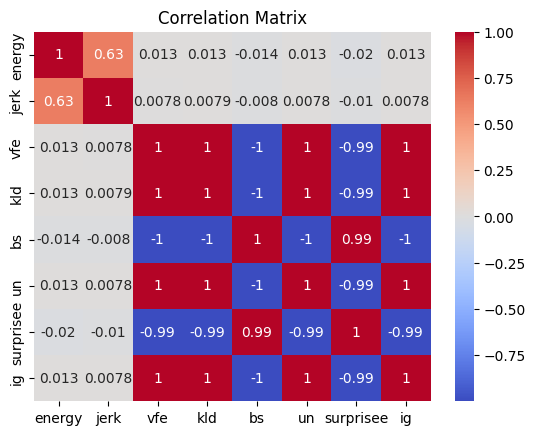

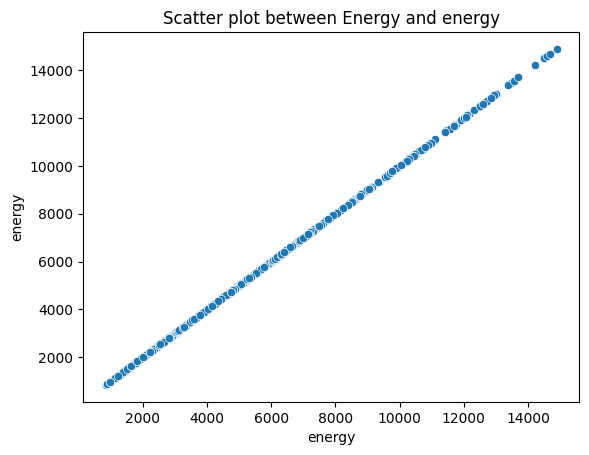

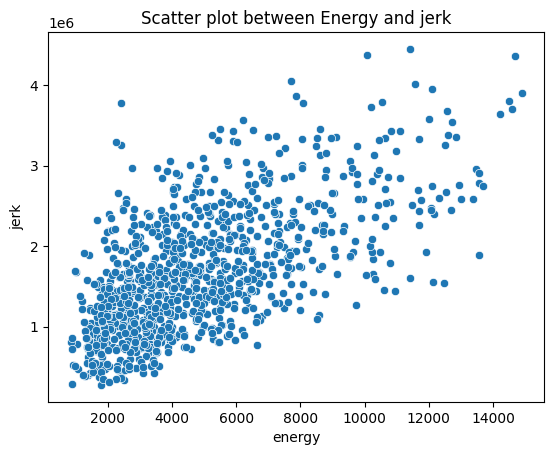

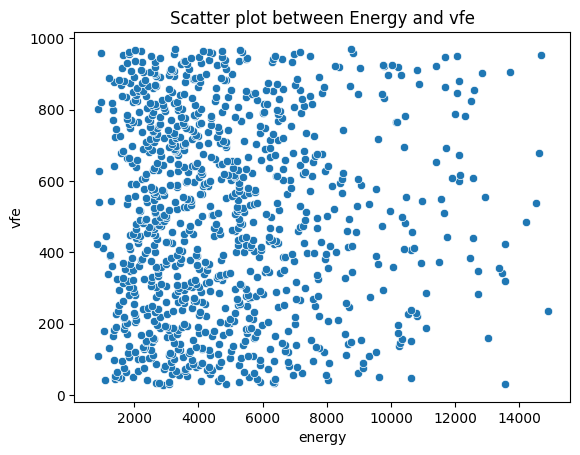

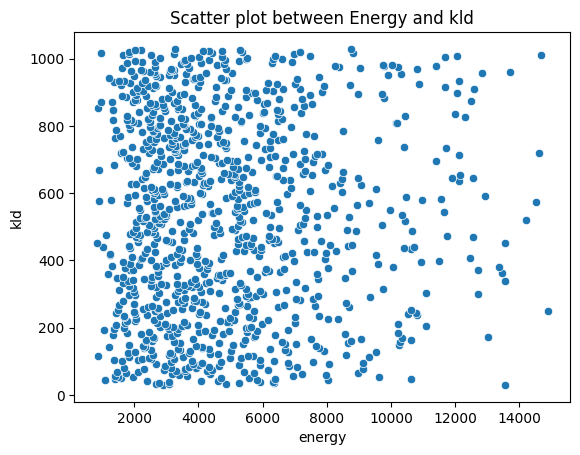

...

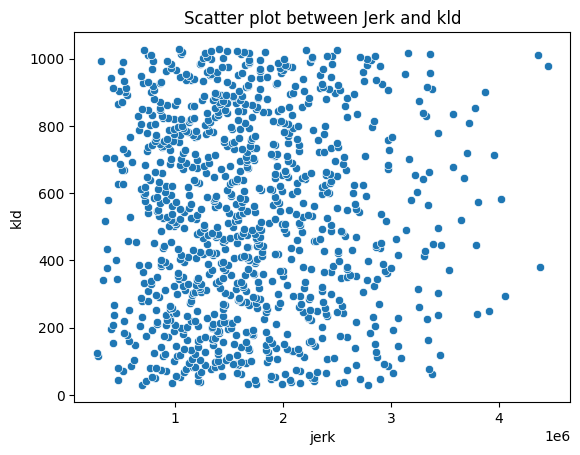

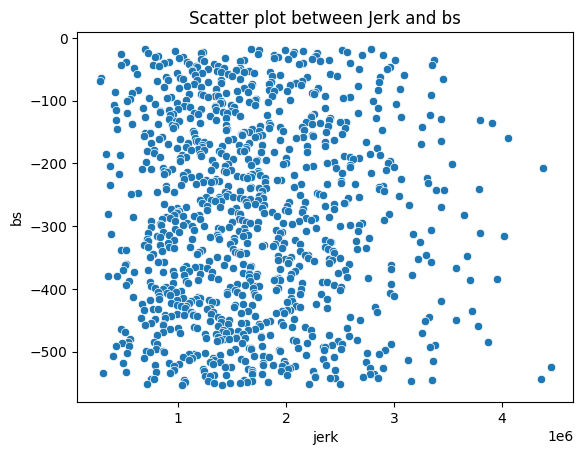

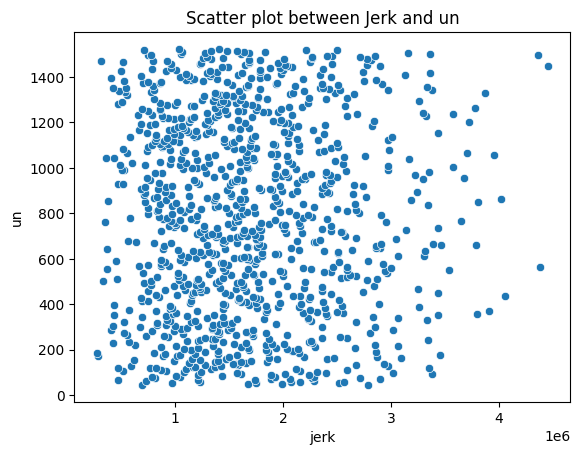

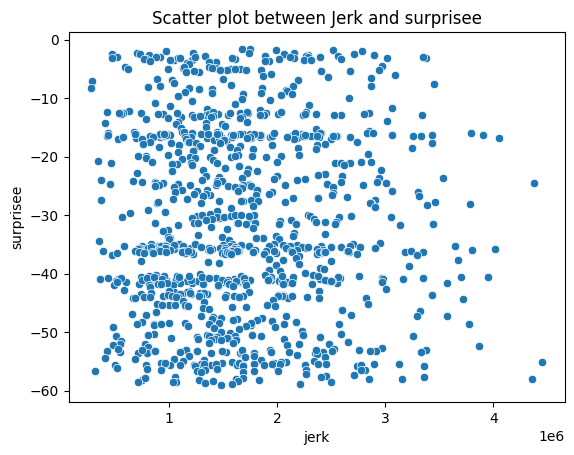

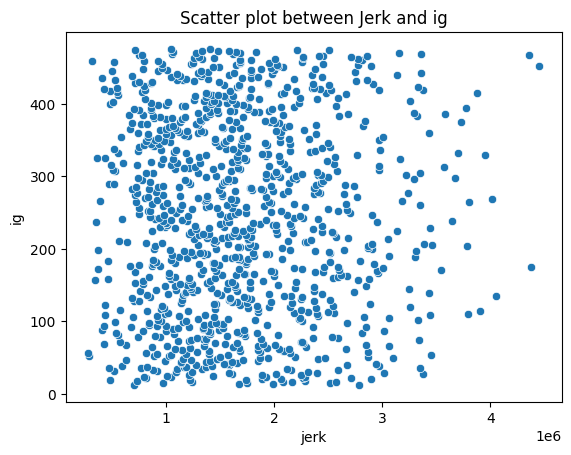

In [ ]:

# ylabels = ['vfe', 'kld', 'bs', 'un', ]
df = pd.DataFrame({'energy': energies, 'jerk': jerks, 'vfe': vfes, 'kld': klds, 'bs': bss, 'un': uns})
df['surprisee'] = df['vfe'] - df['kld']
df['ig'] = df["kld"] + df["bs"]
ylabels = list(df.columns)

import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(df.corr(), annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()


for label in ylabels:
    sns.scatterplot(data=df, x='energy', y=label)
    plt.title(f'Scatter plot between Energy and {label}')
    plt.show()

for label in ylabels:
    sns.scatterplot(data=df, x='jerk', y=label)
    plt.title(f'Scatter plot between Jerk and {label}')
    plt.show()
    


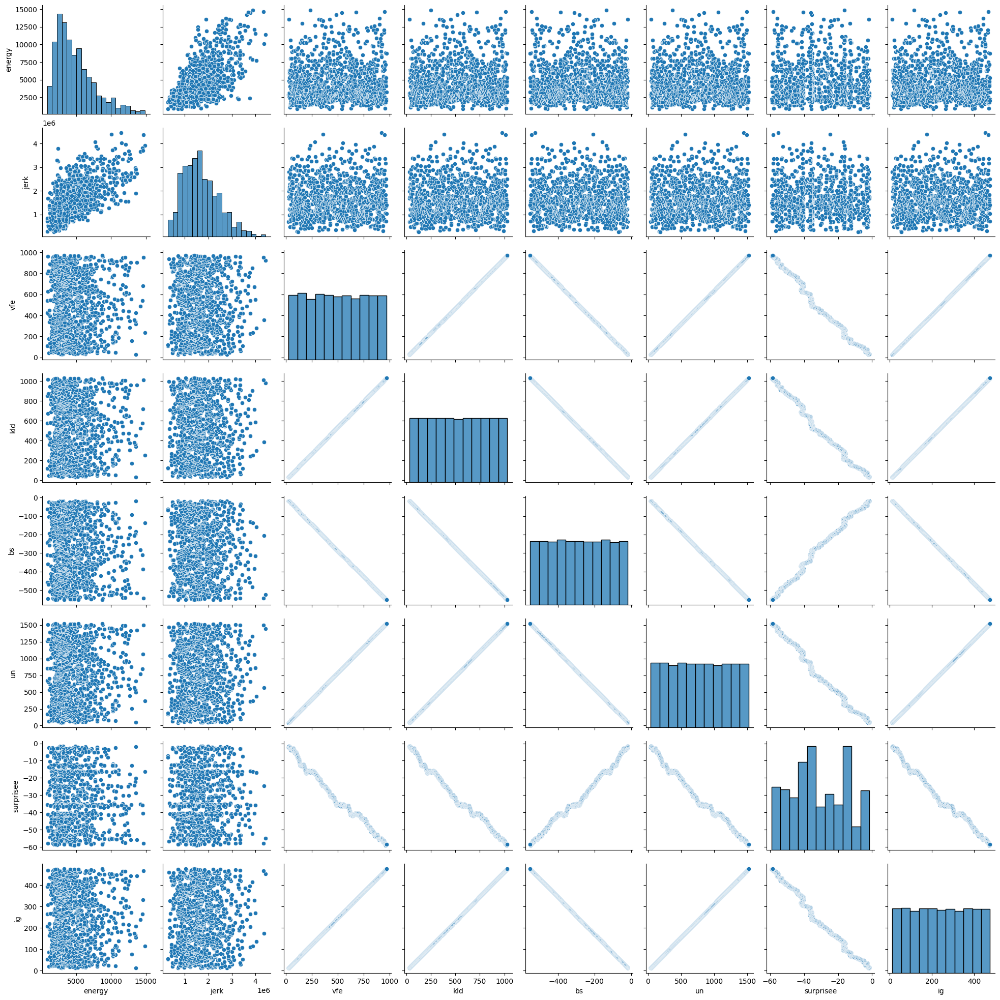

In [ ]:

sns.pairplot(df)
plt.show()

num_obs : [10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10]
num_modalities : 15
num_states : [10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10]
num_factors : 15
num_controls : [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
A[0].shape : (10, 10)
B[0].shape : (10, 10, 1)
C : [array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
 array([0., 0., 0., 

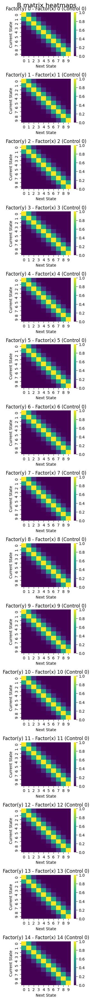

IndexError: Inconsistent shape between the condition and the input (got (10, 1) and (10,))

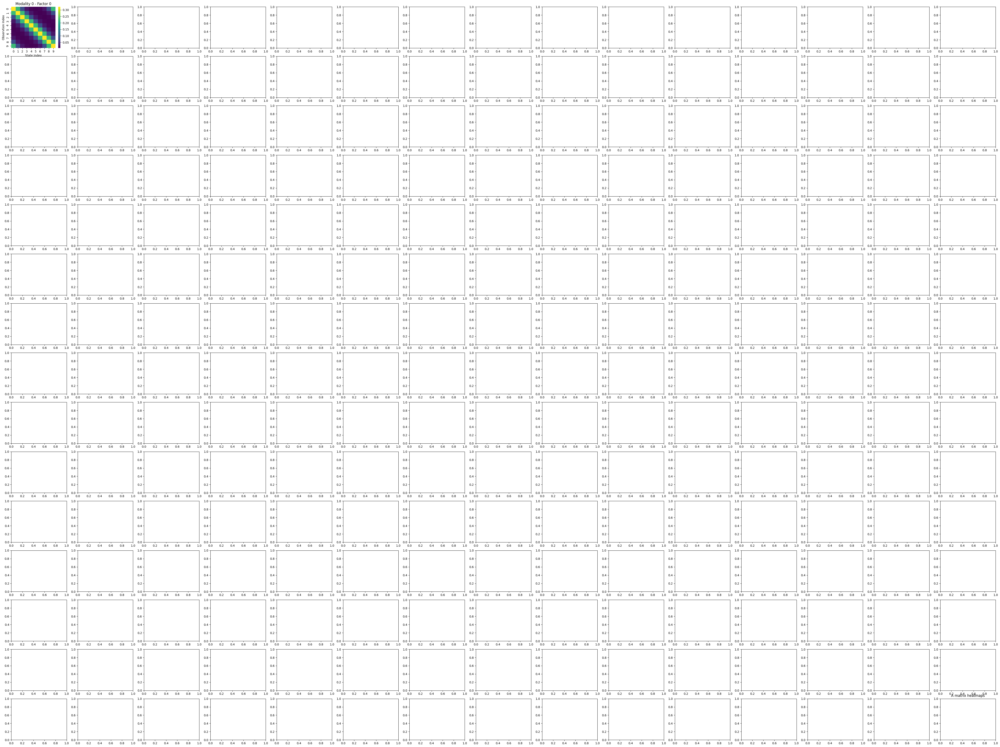

In [ ]:

sim.print_info()
sim.plot_B_all()
sim.plot_A_all()

In [ ]:
dt = 0.05
rbt.computeAllobs(qs,dt)

# for i in range(30):
rbt.obs_onehot[0].shape
rbt.obs_cont.shape

(30, 15)

In [ ]:
rbt.current_obs(0)[0]

array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [ ]:
num_controls = [1 for _ in range(len(num_states))]
B = utils.initialize_empty_B(num_states, num_controls)

In [ ]:
B[0].shape

(10, 10, 1)